
# Crack Detection Using

>## 1.   CRNN-LSTM Method
>## 2.   Computer Vision Method



# Crack Segmentation

>## 1.   ResNet
>## 2.   Unet





In [2]:
#general libraries
import os.path
import os
from pathlib import Path
import glob
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import random
import cv2
from PIL import Image
from warnings import filterwarnings
filterwarnings("ignore", category=UserWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore",category=DeprecationWarning)
from scipy.ndimage.filters import convolve
import shutil
import math
from albumentations import Compose, OneOf, Flip, Rotate, RandomContrast, RandomGamma, RandomBrightness, ElasticTransform, GridDistortion, OpticalDistortion, RGBShift, CLAHE
import time
import datetime

# Tensotflow libraries
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN, LSTM, GlobalAveragePooling2D, SeparableConv2D, ZeroPadding2D, Convolution2D, ZeroPadding2D,concatenate
from tensorflow.keras.utils import  plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Add, BatchNormalization, Input, Activation, Concatenate
from keras.regularizers import l2
from tensorflow.keras.utils import Sequence


#Keras libraries
from keras import models, layers, regularizers
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.preprocessing import image
from keras.utils.np_utils import to_categorical
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model
from keras.models import load_model
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer, SGD


from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from skimage import data, io, filters
from skimage.morphology import convex_hull_image, erosion

#Sklearn libraries
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV, LinearRegression, LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV, cross_val_score



In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import zipfile

## Create Path to images

In [5]:
Crack_Pics = zipfile.ZipFile("/content/drive/MyDrive/Project.zip", 'r')
Crack_Pics.extractall("/tmp")
Crack_Pics.close()
Crack_Pics= Path(r"/tmp/Project")

## Add jpeg to end of images

In [ ]:
Crack_Jpeg = list(Crack_Pics.glob(r"*/*.jpg"))

## Labeling Data to Pos and Neg samples

In [ ]:
Crack_Labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],Crack_Jpeg))

## Conversion to Panda 

In [ ]:
Crack_Jpeg_Pandas = pd.Series(Crack_Jpeg,name="Pics").astype(str)
Crack_Labels_Pandas = pd.Series(Crack_Labels,name="Label")

## Concatinate labels and pics

In [ ]:
Full_Crack_Data = pd.concat([Crack_Jpeg_Pandas,Crack_Labels_Pandas],axis=1)


## diplaying data

In [ ]:
Full_Crack_Data.head(-10)

,Pics,Label
0,/tmp/Project/Positive/02800.jpg,Positive
1,/tmp/Project/Positive/08360.jpg,Positive
2,/tmp/Project/Positive/16525_1.jpg,Positive
3,/tmp/Project/Positive/01007.jpg,Positive
4,/tmp/Project/Positive/08657.jpg,Positive
...,...,...
39985,/tmp/Project/Negative/17799.jpg,Negative
39986,/tmp/Project/Negative/08506.jpg,Negative
39987,/tmp/Project/Negative/00444.jpg,Negative
39988,/tmp/Project/Negative/14249.jpg,Negative


## shuffling data to add randomeness

In [ ]:
Shuffled_Full_Crack_Data = Full_Crack_Data.sample(frac=1).reset_index(drop=True)


In [ ]:
Shuffled_Full_Crack_Data.head(-10)

,Pics,Label
0,/tmp/Project/Negative/15104.jpg,Negative
1,/tmp/Project/Negative/16074.jpg,Negative
2,/tmp/Project/Positive/02211.jpg,Positive
3,/tmp/Project/Negative/17176.jpg,Negative
4,/tmp/Project/Negative/08610.jpg,Negative
...,...,...
39985,/tmp/Project/Negative/04317.jpg,Negative
39986,/tmp/Project/Positive/19689.jpg,Positive
39987,/tmp/Project/Negative/00710.jpg,Negative
39988,/tmp/Project/Positive/02082.jpg,Positive


## Displaying data

In [ ]:
Positive_Samples = Shuffled_Full_Crack_Data[Shuffled_Full_Crack_Data["Label"] == "Positive"]
Positive_Samples = Positive_Samples.reset_index()

Negative_Samples = Shuffled_Full_Crack_Data[Shuffled_Full_Crack_Data["Label"] == "Negative"]
Negative_Samples = Negative_Samples.reset_index()

### Display pics

In [ ]:
def pic_show(pic):
    Img = cv2.imread(pic)
    Img = cv2.cvtColor(Img,cv2.COLOR_BGR2RGB)    
    figure = plt.figure(figsize=(2,2))
    plt.imshow(Img)

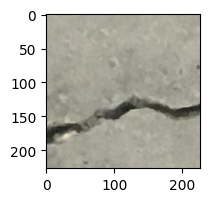

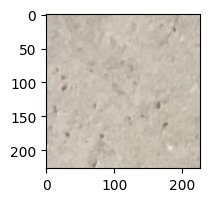

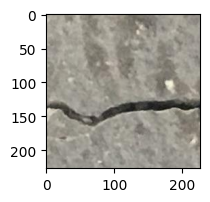

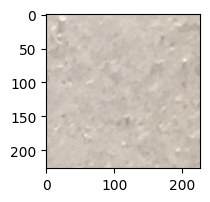

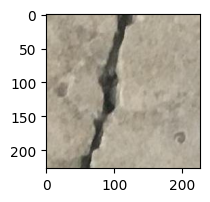

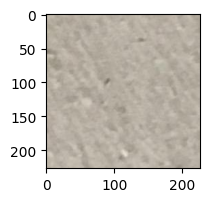

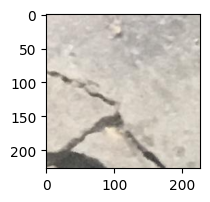

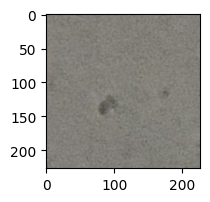

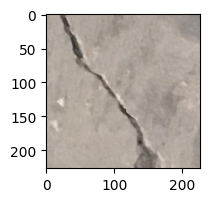

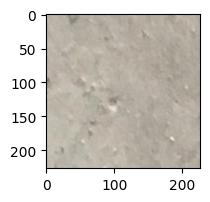

In [ ]:
for i in range(5):
    pic_show(Positive_Samples["Pics"][i])
    pic_show(Negative_Samples["Pics"][i])

# CNN MODEL

## Preparing Data for testing and training

## Since we will be using CNNs we chose only 10% test vs training data

In [ ]:
X_train,X_test = train_test_split(Shuffled_Full_Crack_Data,train_size=0.9,shuffle=True,random_state=77)


In [ ]:
X_train.head(10)

,Pics,Label
36876,/tmp/Project/Positive/06813.jpg,Positive
16019,/tmp/Project/Negative/00132.jpg,Negative
3593,/tmp/Project/Negative/06248.jpg,Negative
1245,/tmp/Project/Negative/14492.jpg,Negative
15889,/tmp/Project/Positive/01528.jpg,Positive
31019,/tmp/Project/Positive/03214.jpg,Positive
31133,/tmp/Project/Positive/10229_1.jpg,Positive
23264,/tmp/Project/Positive/11095_1.jpg,Positive
12508,/tmp/Project/Positive/10557_1.jpg,Positive
37230,/tmp/Project/Positive/05763.jpg,Positive


In [ ]:
X_test.head(10)

,Pics,Label
17712,/tmp/Project/Positive/17407_1.jpg,Positive
22541,/tmp/Project/Positive/16303_1.jpg,Positive
19874,/tmp/Project/Negative/05119.jpg,Negative
19827,/tmp/Project/Positive/01801.jpg,Positive
34084,/tmp/Project/Positive/01796.jpg,Positive
16001,/tmp/Project/Positive/14064_1.jpg,Positive
4108,/tmp/Project/Negative/12242.jpg,Negative
12845,/tmp/Project/Positive/14067_1.jpg,Positive
13546,/tmp/Project/Positive/06958.jpg,Positive
1387,/tmp/Project/Negative/01437.jpg,Negative


In [ ]:
X_test.shape

(4000, 2)

In [ ]:
X_train.shape

(36000, 2)

## Augment and Split data to test, validate and train 

In [ ]:
Train_gen = ImageDataGenerator(rescale=1./255,
                                        rotation_range=25,
                                        shear_range=0.5,
                                        zoom_range=0.5,
                                        width_shift_range=0.2,
                                        height_shift_range=0.2,
                                        brightness_range=[0.6,0.9],
                                        vertical_flip=True,
                                        validation_split=0.1)

In [ ]:
Test_gen = ImageDataGenerator(rescale=1./255)


In [ ]:
Training_Data = Train_gen.flow_from_dataframe(dataframe=X_train, x_col="Pics", y_col="Label", 
                                              color_mode="rgb",class_mode="binary", target_size=(200,200), 
                                              subset="training",batch_size=32,seed=42)
                                                   
                                                   
                                                   
                                                   
                                                   
                                                    

Found 32400 validated image filenames belonging to 2 classes.


In [ ]:
Valid_Data = Train_gen.flow_from_dataframe(dataframe=X_train, x_col="Pics",y_col="Label",color_mode="rgb",
                                                   class_mode="binary", target_size=(200,200),subset="validation",
                                                    batch_size=32,seed=42)

Found 3600 validated image filenames belonging to 2 classes.


In [ ]:
Testing_Data = Test_gen.flow_from_dataframe(dataframe=X_test, x_col="Pics", y_col="Label",color_mode="rgb",class_mode="binary",
                                                   target_size=(200,200),batch_size=32,seed=42)

Found 4000 validated image filenames belonging to 2 classes.


##  Creating Model RNN-LSTM

### defining model parameters:

In [ ]:
category = 1
loss_function = "binary_crossentropy"
optimizer = "adam"
inputModel = (Training_Data.image_shape[0],Training_Data.image_shape[1],Training_Data.image_shape[2])


In [ ]:
stop_point = tf.keras.callbacks.EarlyStopping(monitor="loss",patience=4,mode="min")
Model_check = tf.keras.callbacks.ModelCheckpoint(monitor="val_accuracy", save_best_only=True, save_weights_only=True,
                                                      filepath="./modelcheck")

## Model creation

In [ ]:
Model = Sequential()

#layer #1
Model.add(Conv2D(32,(3,3),activation="relu",input_shape=inputModel))
Model.add(BatchNormalization())
Model.add(MaxPooling2D((2,2),strides=2))

#layer #2
Model.add(Conv2D(64,(3,3),activation="relu",padding="same"))
Model.add(Dropout(0.2))
Model.add(MaxPooling2D((2,2),strides=2))

#layer #3
Model.add(Conv2D(128,(3,3),activation="relu",padding="same"))
Model.add(Dropout(0.3))
Model.add(MaxPooling2D((2,2),strides=2))

#layer #4
Model.add(Conv2D(256,(3,3),activation="relu",padding="same"))
Model.add(Dropout(0.4))
Model.add(MaxPooling2D((2,2),strides=2))

#layer #5
Model.add(Flatten())
Model.add(Dense(1024,activation="relu"))
Model.add(Dropout(0.5))
Model.add(Dense(category,activation="sigmoid"))

## Model Summary

In [ ]:
print(Model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 198, 198, 32)     128       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 99, 99, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 99, 99, 64)        18496     
                                                                 
 dropout (Dropout)           (None, 99, 99, 64)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 49, 49, 64)       0

## Running the model

In [ ]:
Model.compile(optimizer=optimizer,loss=loss_function ,metrics=["accuracy"])

In [ ]:
RNN = Model.fit(Training_Data, validation_data=Valid_Data,callbacks=[stop_point,Model_check],epochs=10)

Epoch 1/10
1013/1013 [==============================] - 461s 443ms/step - loss: 0.1304 - accuracy: 0.9687 - val_loss: 0.1289 - val_accuracy: 0.9692
Epoch 2/10
1013/1013 [==============================] - 442s 436ms/step - loss: 0.0487 - accuracy: 0.9860 - val_loss: 0.0981 - val_accuracy: 0.9756
Epoch 3/10
1013/1013 [==============================] - 440s 434ms/step - loss: 0.0478 - accuracy: 0.9870 - val_loss: 0.0441 - val_accuracy: 0.9850
Epoch 4/10
1013/1013 [==============================] - 440s 434ms/step - loss: 0.0377 - accuracy: 0.9897 - val_loss: 0.0303 - val_accuracy: 0.9914
Epoch 5/10
1013/1013 [==============================] - 488s 482ms/step - loss: 0.0345 - accuracy: 0.9906 - val_loss: 0.1979 - val_accuracy: 0.9747
Epoch 6/10
1013/1013 [==============================] - 441s 435ms/step - loss: 0.0345 - accuracy: 0.9904 - val_loss: 0.0279 - val_accuracy: 0.9911
Epoch 7/10
1013/1013 [==============================] - 484s 478ms/step - loss: 0.0344 - accuracy: 0.9912 - val_

In [ ]:
Model.save("Model.h5")

## Training Loss Error Visualization

<Axes: >

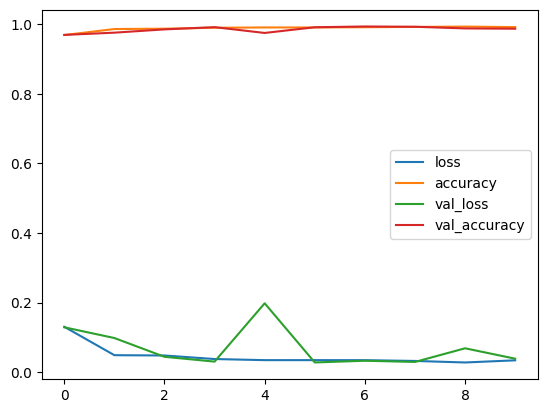

In [ ]:
Visuals = pd.DataFrame(RNN.history)
Visuals.plot()

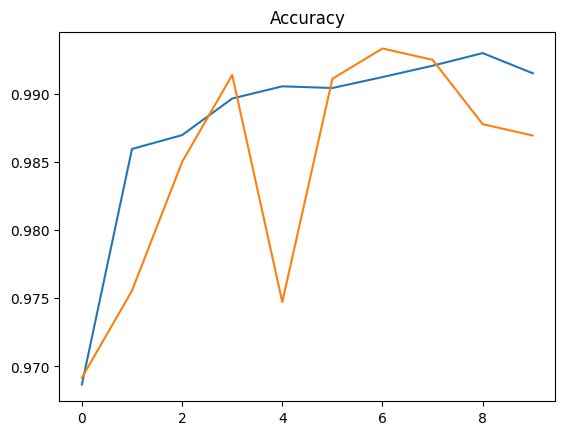

In [ ]:
plt.plot(RNN.history["accuracy"])
plt.plot(RNN.history["val_accuracy"])
plt.title("Accuracy")
plt.show()

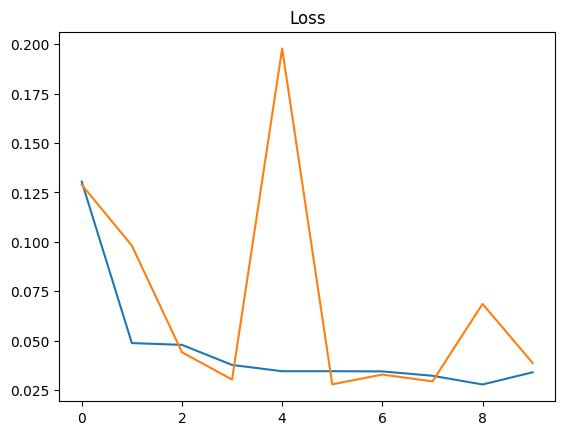

In [ ]:
plt.plot(RNN.history["loss"])
plt.plot(RNN.history["val_loss"])
plt.title("Loss")
plt.show()

## Prediction 

In [ ]:
Pred = Model.evaluate(Testing_Data)
print("Our model's loss is:  " + str(Pred[0]), " And Our model's Accyracy is:  " + str(Pred[1]))

125/125 [==============================] - 9s 68ms/step - loss: 0.0360 - accuracy: 0.9880
Our model's loss is:  0.036039043217897415  And Our model's Accyracy is:  0.9879999756813049


In [ ]:
Pred_final = Model.predict(Testing_Data)
Pred_final = Pred_final.argmax(axis=-1)


125/125 [==============================] - 9s 69ms/step


## Visualizing Some Prediction Results

# Crack Detection Using Only OpenCV functions (contouring)

## Canny Function:

In [ ]:
def canny(pic):
    Img = cv2.imread(pic)
    Img = cv2.cvtColor(Img,cv2.COLOR_BGR2RGB)
    Canny = cv2.Canny(Img,100,150)
    figure = plt.figure(figsize=(2,2))
    plt.imshow(Canny)

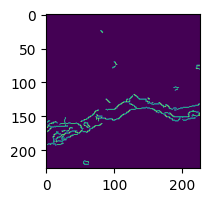

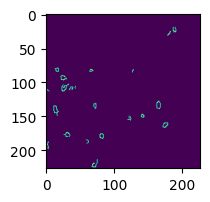

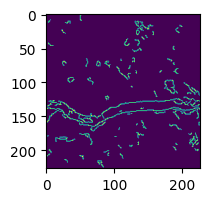

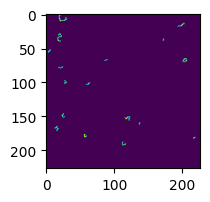

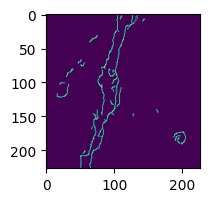

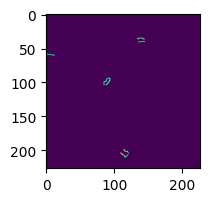

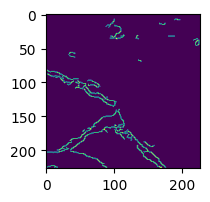

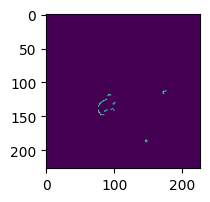

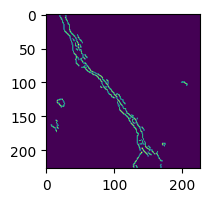

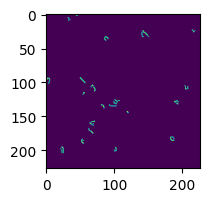

In [ ]:
for i in range(5):
    canny(Positive_Samples["Pics"][i])
    canny(Negative_Samples["Pics"][i])

## Thresholding

In [ ]:
def threshold(pic):
    
    Img = cv2.imread(pic)
    Img = cv2.cvtColor(Img,cv2.COLOR_BGR2RGB)
    _,Threshold = cv2.threshold(Img,110,255,cv2.THRESH_BINARY_INV)
    figure = plt.figure(figsize=(2,2))
    plt.imshow(Threshold)

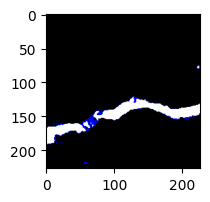

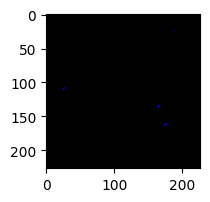

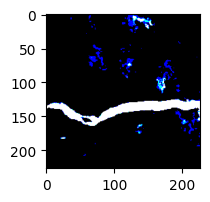

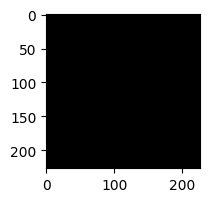

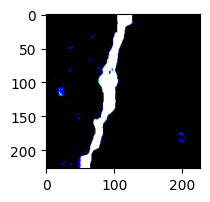

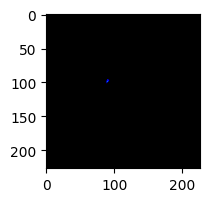

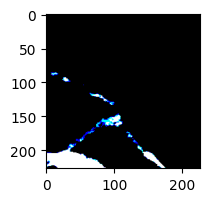

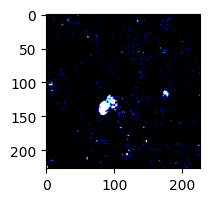

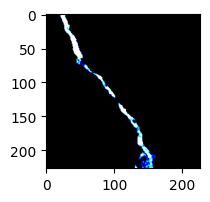

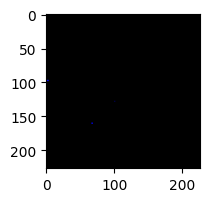

In [ ]:
for i in range(5):
    threshold(Positive_Samples["Pics"][i])
    threshold(Negative_Samples["Pics"][i])

In [ ]:
def canny_tresh(pic):
    Img = cv2.imread(pic)
    Img = cv2.cvtColor(Img,cv2.COLOR_BGR2RGB)
    _,Threshold = cv2.threshold(Img,120,255,cv2.THRESH_BINARY_INV)
    Canny= cv2.Canny(Threshold,80,100)
    figure = plt.figure(figsize=(2,2))
    plt.imshow(Canny)

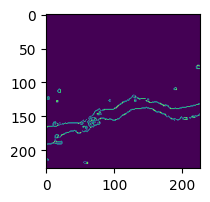

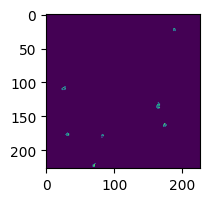

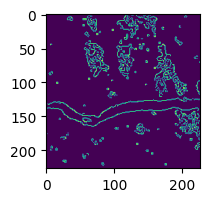

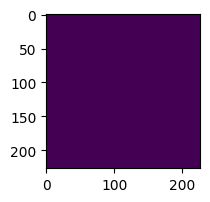

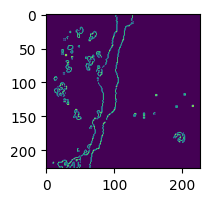

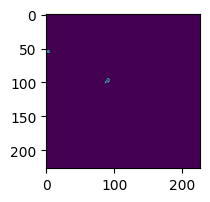

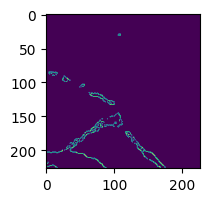

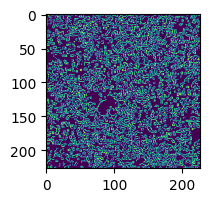

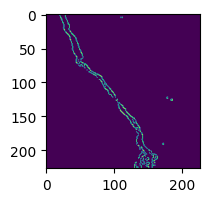

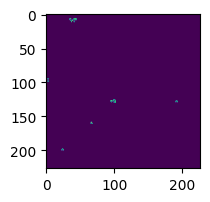

In [ ]:
for i in range(5):
    canny_tresh(Positive_Samples["Pics"][i])
    canny_tresh(Negative_Samples["Pics"][i])

## Contouring

In [ ]:
def contouring(pic):

    Img = cv2.imread(pic)
    Img = cv2.cvtColor(Img,cv2.COLOR_BGR2RGB)
    _,Threshold = cv2.threshold(Img,110,255,cv2.THRESH_BINARY_INV)
    Canny= cv2.Canny(Threshold,80,100)
    Contours,_ = cv2.findContours(Canny,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    Lines = cv2.drawContours(Img,Contours,-1,(255,0,0),1)
    figure = plt.figure(figsize=(2,2))
    plt.imshow(Lines)
    

    

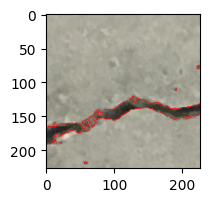

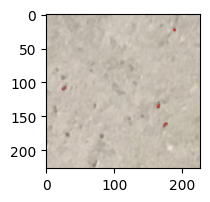

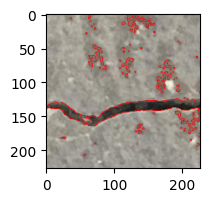

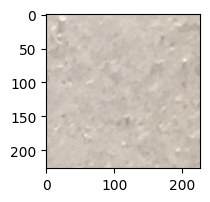

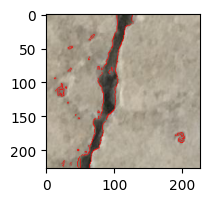

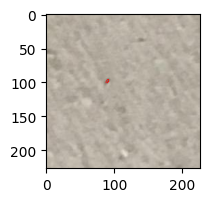

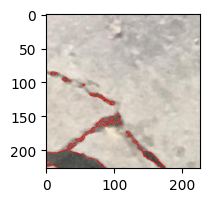

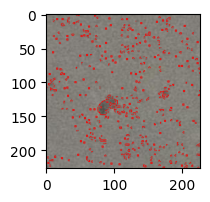

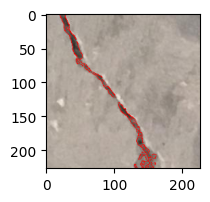

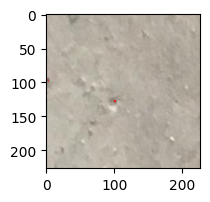

In [ ]:
for i in range(5):
    contouring(Positive_Samples["Pics"][i])
    contouring(Negative_Samples["Pics"][i])

## Threshold Skeleton Morphology

In [ ]:
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from skimage import data, io, filters
import skimage

def Morphology(pic):

    Img = cv2.imread(pic)
    Img = cv2.cvtColor(Img,cv2.COLOR_BGR2GRAY)
    _,thresh_pic = cv2.threshold(Img,100,255,cv2.THRESH_BINARY_INV)
    pic_list = np.array(Img > thresh_pic).astype(int)
    Morphology_pic = skimage.morphology.skeletonize(pic_list)
    figure,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,12))
    ax[0].imshow(Img,cmap="Greys_r")
    ax[1].imshow(Morphology_pic)

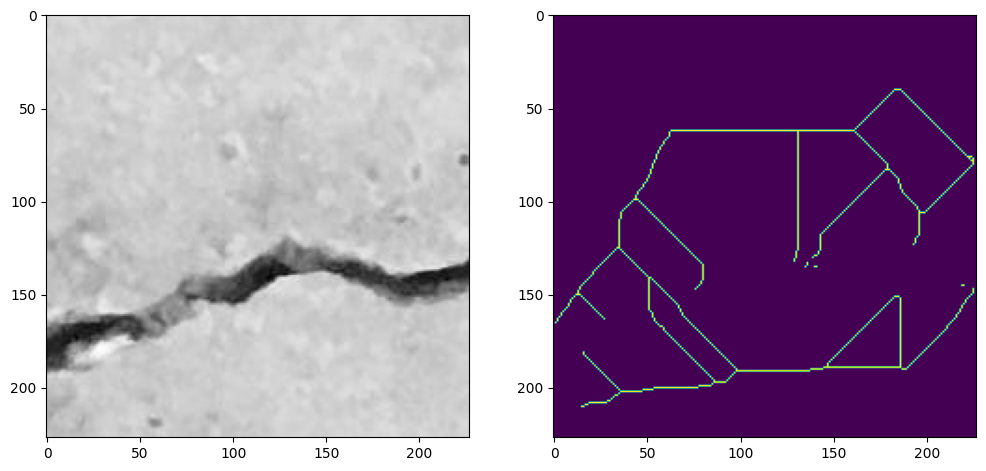

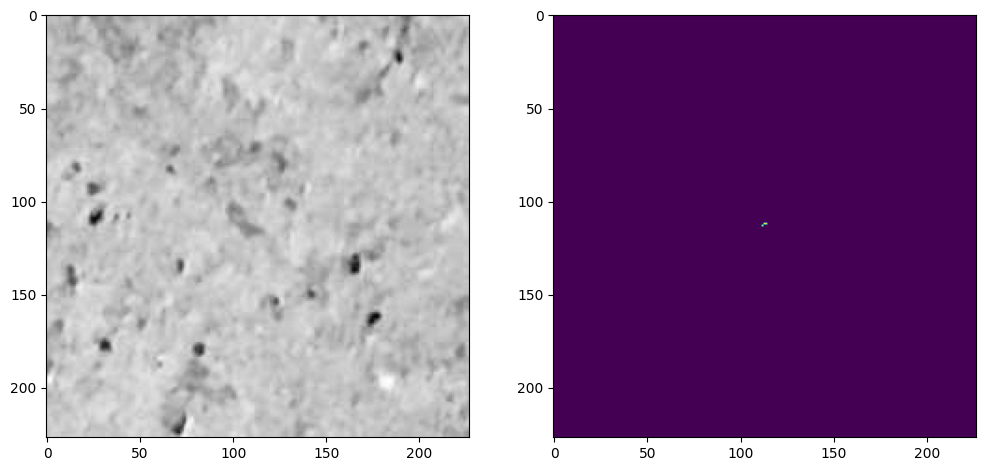

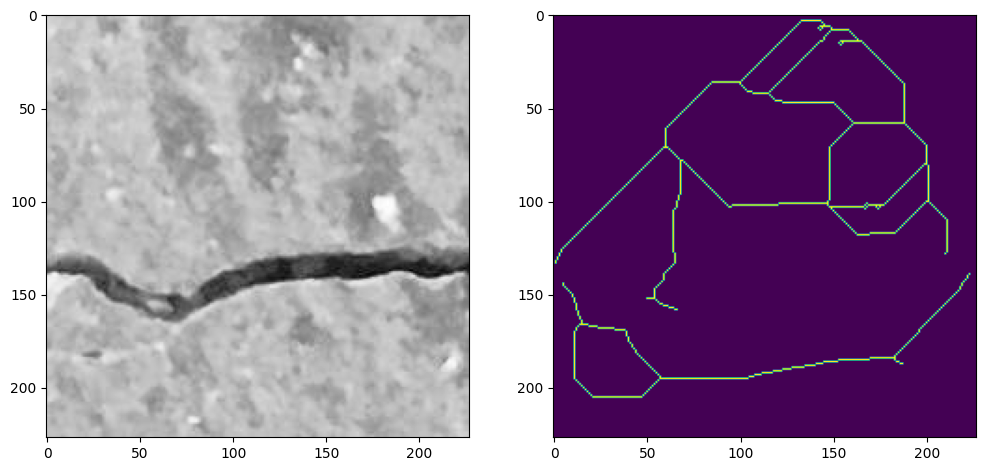

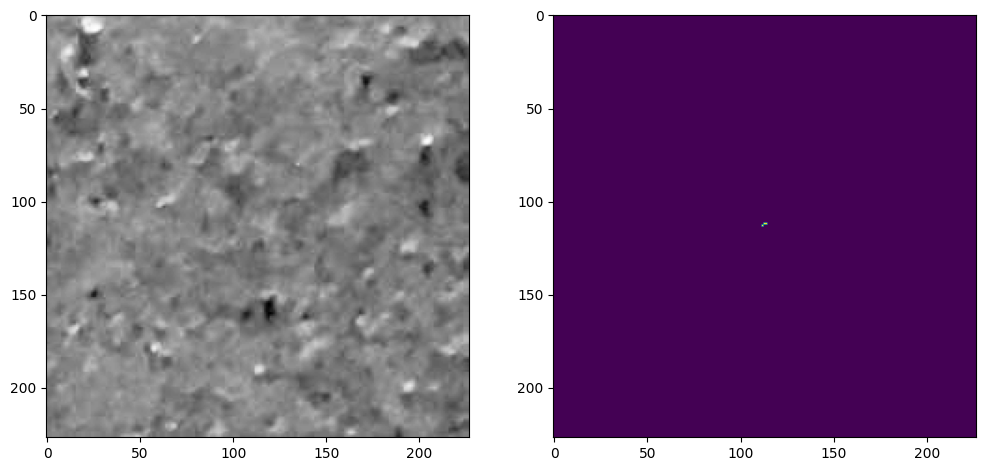

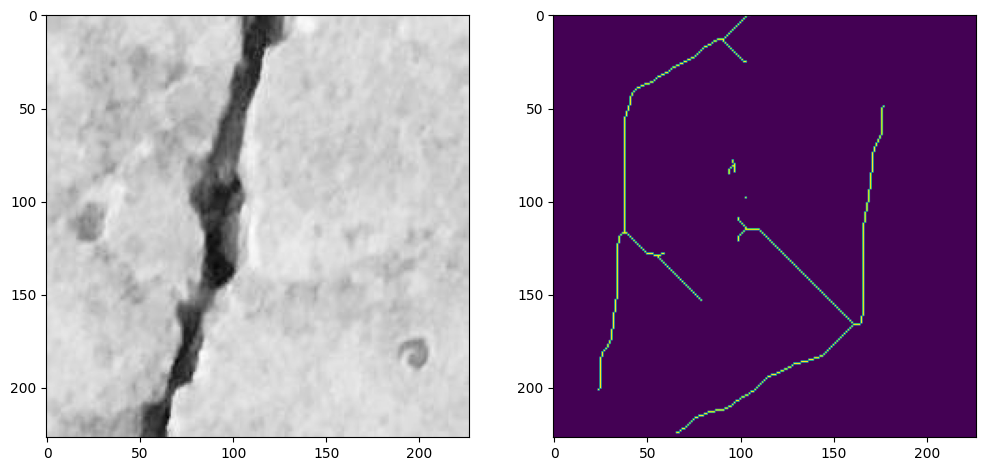

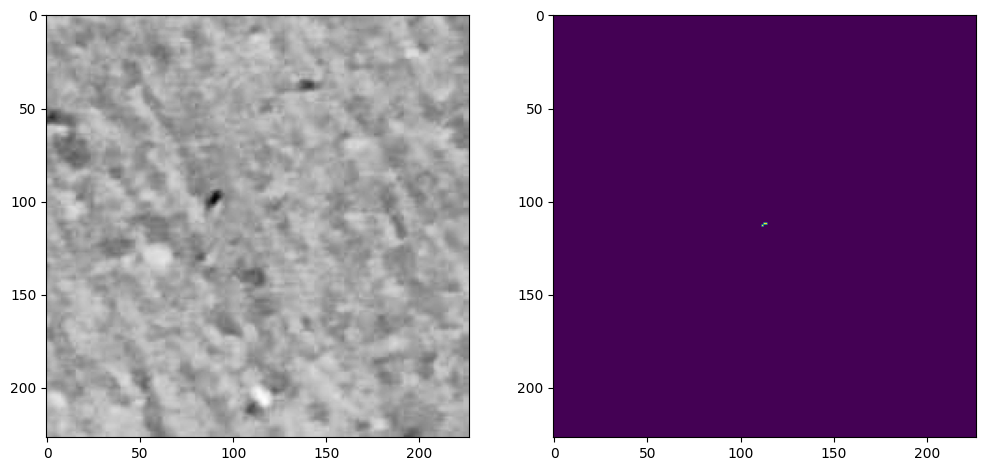

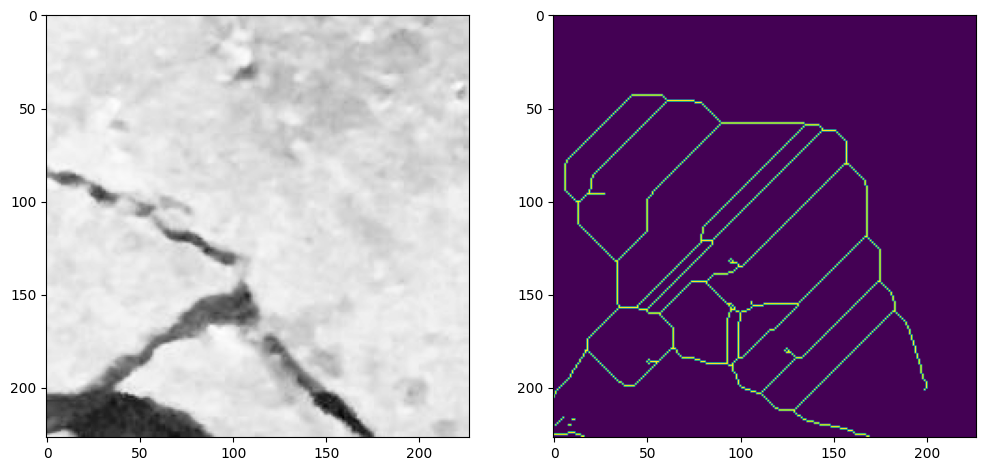

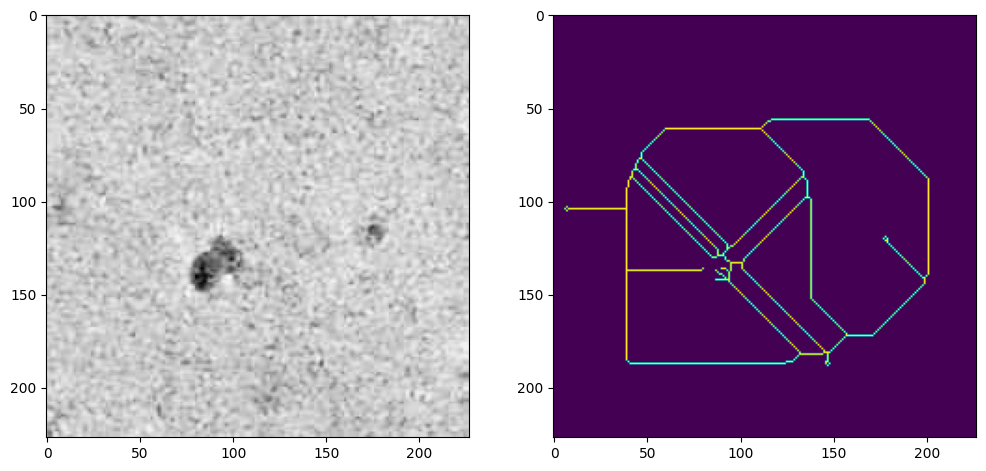

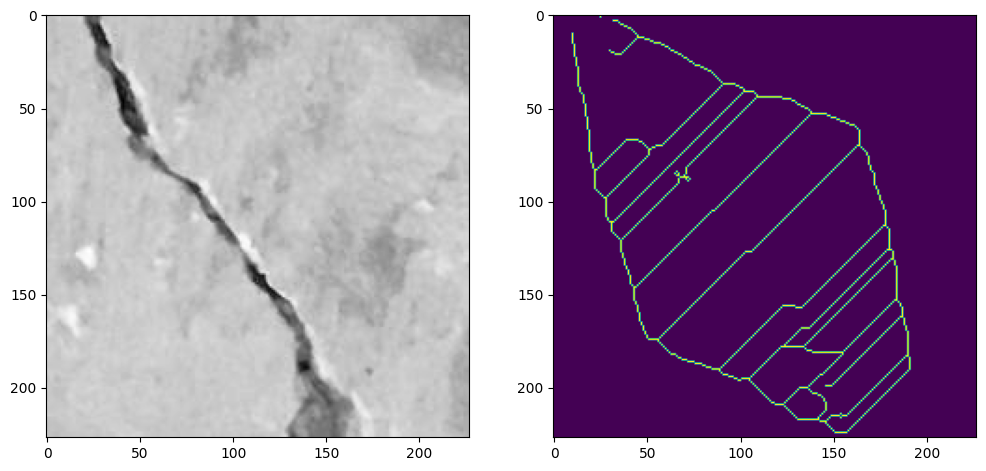

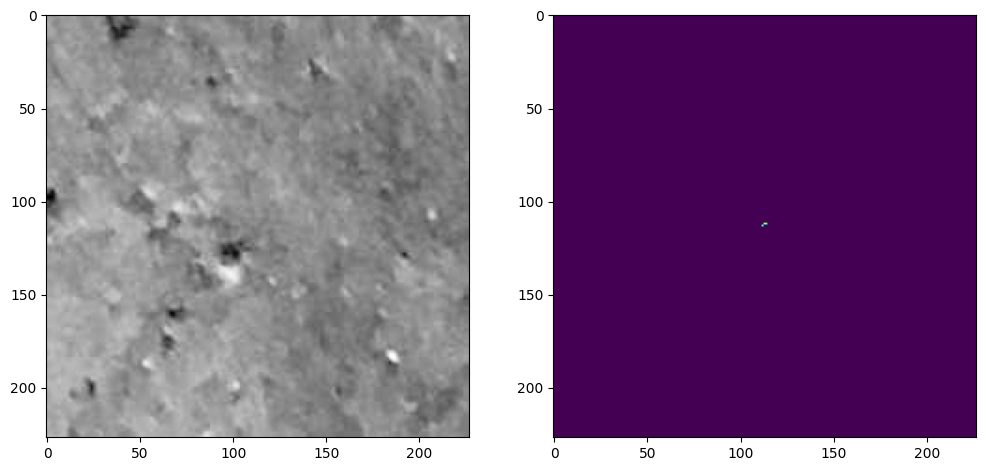

In [ ]:


for i in range(5):
    Morphology(Positive_Samples["Pics"][i])
    Morphology(Negative_Samples["Pics"][i])

## Canny Skeleton Morphology

In [ ]:
def Canny_Morphology(pic):

    Img = cv2.imread(pic)
    Img = cv2.cvtColor(Img,cv2.COLOR_BGR2GRAY)
    _,thresh_pic = cv2.threshold(Img,100,255,cv2.THRESH_BINARY_INV)
    canny = cv2.Canny(thresh_pic,90,100)
    pic_list = np.array(Img > canny).astype(int)
    Morphology_pic = skimage.morphology.skeletonize(pic_list)
    figure,ax = plt.subplots(nrows=1,ncols=2,figsize=(12,12))
    ax[0].imshow(Img,cmap="Greys_r")
    ax[1].imshow(Morphology_pic)


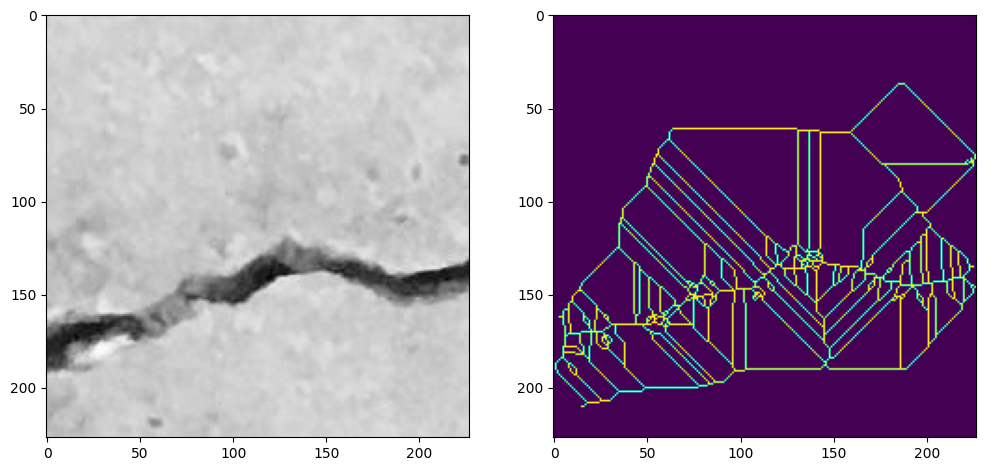

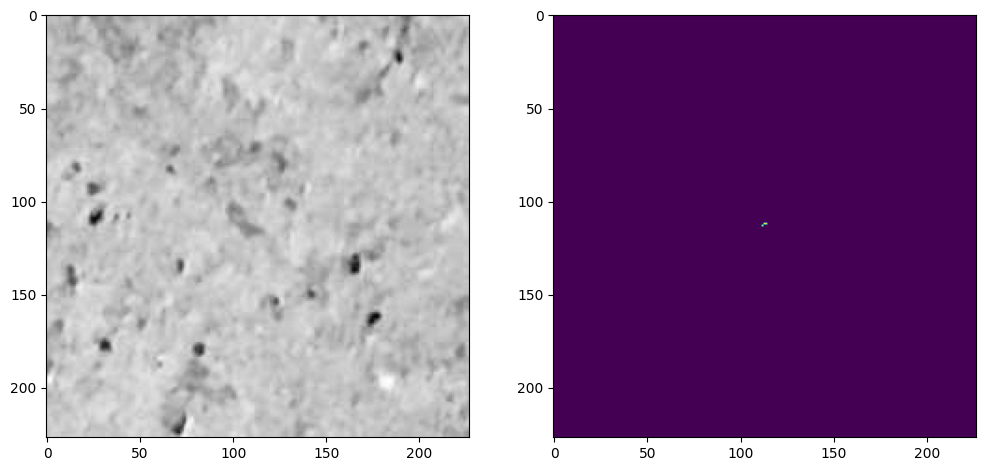

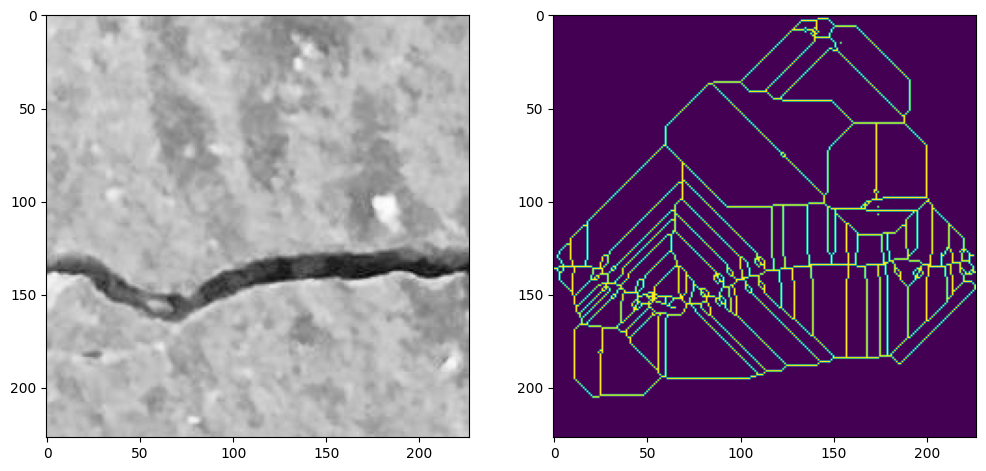

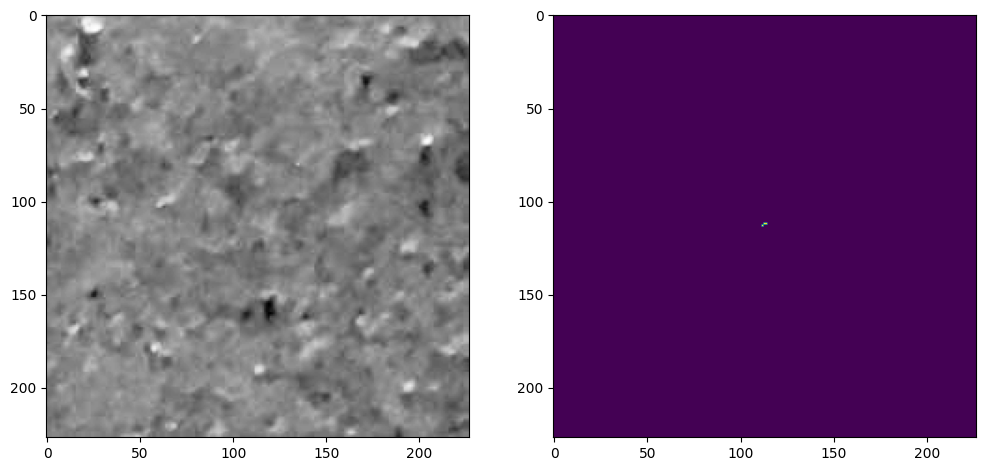

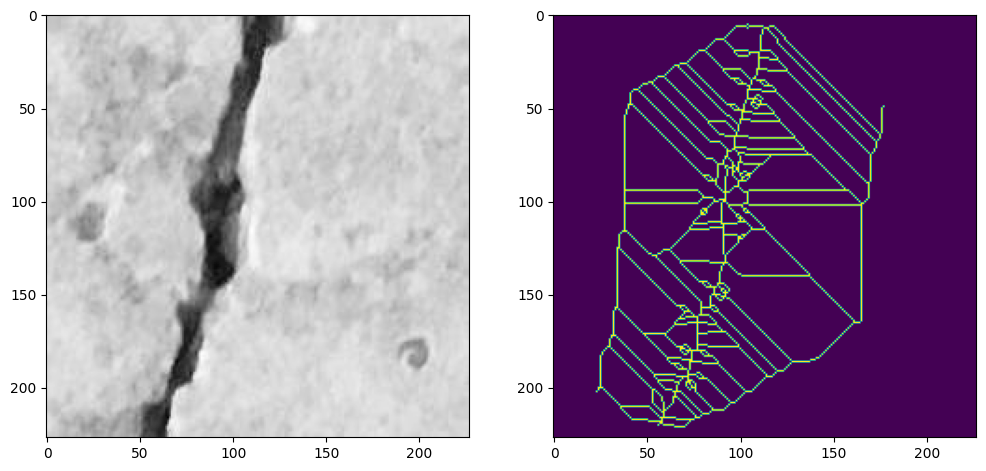

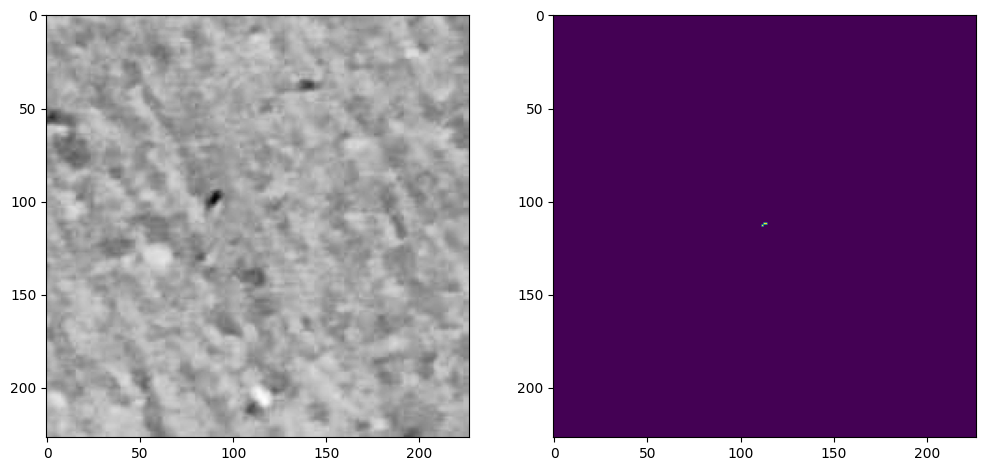

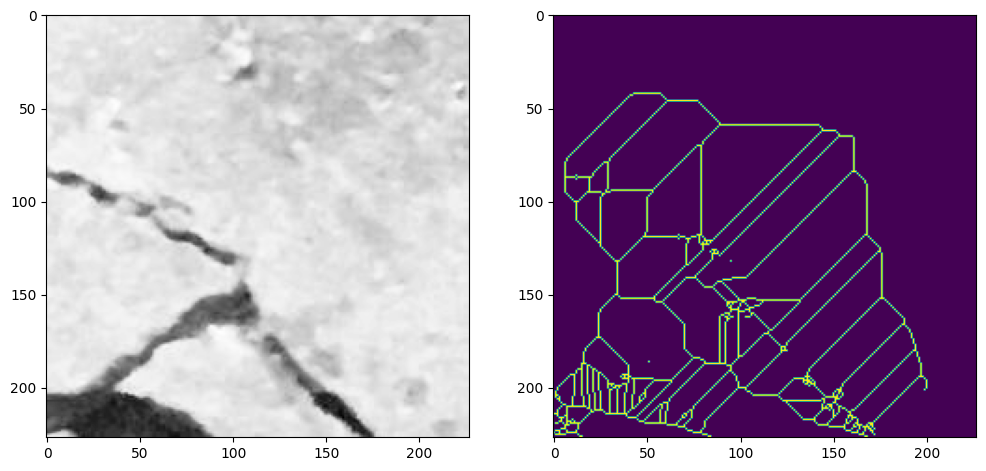

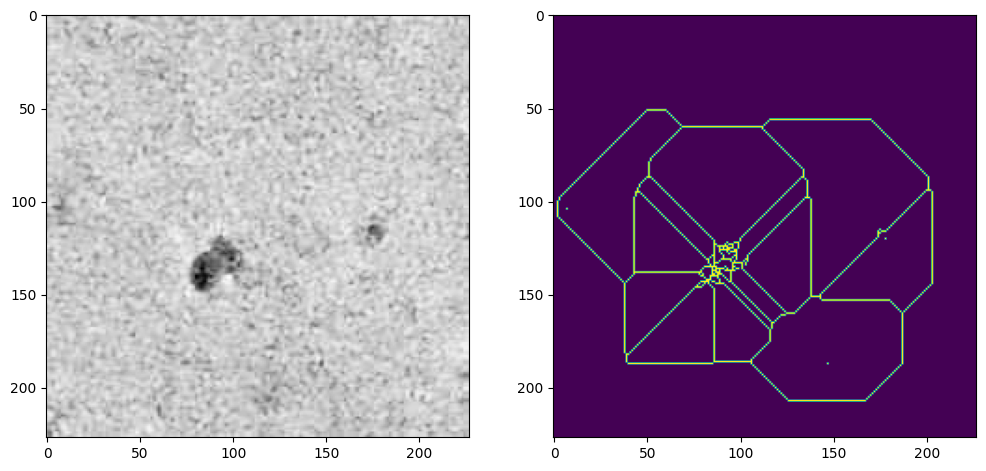

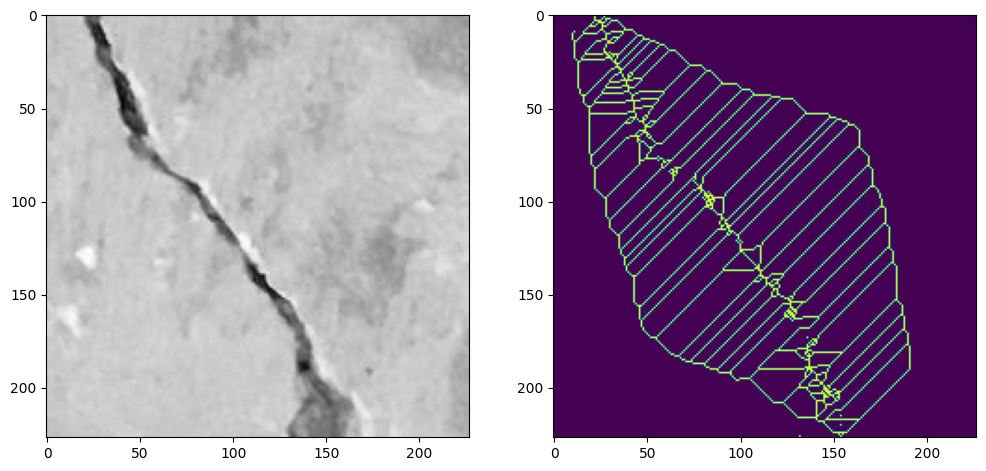

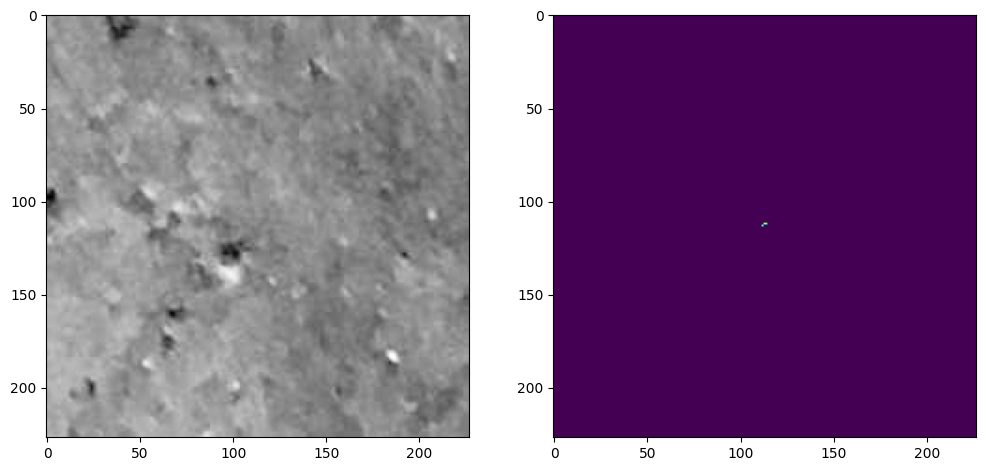

In [ ]:
for i in range(5):
    Canny_Morphology(Positive_Samples["Pics"][i])
    Canny_Morphology(Negative_Samples["Pics"][i])

In [ ]:
def crack(img, thresh):
    
    #load image
    Img = cv2.imread(img)
    # convert image to gray to perform tranformations
    grayImg = cv2.cvtColor(Img, cv2.COLOR_BGR2GRAY)
    
    #sharpen image
    sharp = np.array([[-1,-1,-1], [-1,11,-1], [-1,-1,-1]])
    Img_Sharp = cv2.filter2D(grayImg, -1, sharp)
    
    #blurring image
    Img_Blur = cv2.GaussianBlur(Img_Sharp, (3, 3), 0)
    
    #make image binary
    x, y= cv2.threshold(Img_Blur, 235, 255, cv2.THRESH_BINARY_INV)
    
    # contours
    c, z = cv2.findContours(y, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    
    if c:
        max_Len = max([len(con) for con in c])
        if max_Len < thresh:
            return True
        else:
            return False
    else:
        return True
    

In [ ]:
result = dict()
pos=0
neg=0
#looping over shuffled data
for i in range(len(Shuffled_Full_Crack_Data)):

    crack_status = crack(Shuffled_Full_Crack_Data["Pics"][i], 80)
    if crack_status:
        pos+=1
    else:
        neg+=1

In [ ]:
pos

In [ ]:
neg

### Accuracy = (TP + TN) / (TP + TN + FP + FN)
### Precision = TP / (TP + FP)
### Recall = TP / (TP + FN)
### F1 Score = (2 x Precision x Recall) / (Precision + Recall)


In [ ]:
TotalPos = 20000
FalsPos = pos-20000

Precision = TotalPos/ (TotalPos + FalsPos)

RealNeg = neg

accuracy = (TotalPos + RealNeg) / (40000 + FalsPos)

Recall = TotalPos/(TotalPos+0)

Fscore = (2*Recall *Precision )/ (Precision +Recall)
print(f'Accuracy is {accuracy*100}%')
print(f'Precision is {Precision*100}%')
print(f'Recall is {Recall*100}%')
print(f'F1 Score is {Fscore*100}%')


# 2. Crack Segmentation

## 2.A. Crack Segmentation Using ResNet

In [6]:
local_zip = '/content/drive/MyDrive/DeepCrack.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall()
zip_ref.close()
print("Done")

Done


In [7]:
! nvidia-smi

Sat Apr 22 16:55:48 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   50C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Defining Directories

In [61]:
TrainDir = r'/content/train_img'
TrainMaskDir = r'/content/train_lab'
TestDir = r'/content/test_img'
TestMaskDir = r'/content/test_lab'


PathTrain = sorted([os.path.join(TrainDir, fname) for fname in os.listdir(TrainDir) if fname.endswith(".jpg") and not fname.startswith(".")])
PathTrainMask = sorted([os.path.join(TrainMaskDir, fname) for fname in os.listdir(TrainMaskDir) if fname.endswith(".png") and not fname.startswith(".")])
PathTest = sorted([os.path.join(TestDir, fname) for fname in os.listdir(TestDir) if fname.endswith(".jpg") and not fname.startswith(".")])
PathTestMask = sorted([os.path.join(TestMaskDir, fname) for fname in os.listdir(TestMaskDir) if fname.endswith(".png") and not fname.startswith(".")])


## Splitting Test and Validation

In [62]:
import random
combined = list(zip(PathTrain, PathTrainMask))
random.shuffle(combined)
PathTrain[:], PathTrainMask[:] = zip(*combined)


In [63]:
trainImagePics= PathTrain[:280]
trainMaskPics = PathTrainMask[:280]
ValidImagePics = PathTrain[280:]
ValidMaskPics = PathTrainMask[280:]



In [64]:
from pickle import TRUE
class MakeImage(Sequence):

  def __init__(self, img, mask, batch=5, dim=(128, 128), augmentation=False):
      self.img = img
      self.mask = mask
      self.batch = batch
      self.dim = dim
      self.augmentation = augmentation

  def __len__(self):
      return math.ceil(len(self.img) / self.batch)

  augment = Compose(              
    [ OneOf([ RandomGamma(),RandomContrast(),RandomBrightness()], p=0.4),
      OneOf([ GridDistortion(),ElasticTransform(alpha=150, sigma=150 * 0.04, alpha_affine=150 * 0.01), OpticalDistortion(distort_limit=2.5, shift_limit=0.75)], p=0.4),
      Rotate(p=0.6),Flip(p=0.6),
    ])


  def __getitem__(self, index):
      imgBatch = self.img[index * self.batch:(index + 1) * self.batch]
      maskBatch = self.mask[index * self.batch:(index + 1) * self.batch]

      imgBatch = np.array([cv2.resize(cv2.cvtColor(cv2.imread(file_name, -1), cv2.COLOR_BGR2RGB), (self.dim[1], self.dim[0])) for file_name in imgBatch])
      maskBatch = np.array([(cv2.resize(cv2.imread(file_name, -1), (self.dim[1], self.dim[0]))>0).astype(np.uint8) for file_name in maskBatch])
      if self.augmentation is True:
        aug = [self.augment(image=i, mask=j) for i, j in zip(imgBatch, maskBatch)]
        imgBatch = np.array([i['image'] for i in aug])
        maskBatch = np.array([j['mask'] for j in aug])
      maskBatch = np.expand_dims(maskBatch, -1)

      return imgBatch/255, maskBatch/1  


In [12]:
MakeTrain = MakeImage(trainImagePics, trainMaskPics)
MakeValid = MakeImage(ValidImagePics, ValidMaskPics)
MakeTest=MakeImage(PathTest,PathTestMask)

k = [MakeTrain, MakeValid, MakeTest]

In [13]:
for m in k:
  for i, j in m:
    break

  print(i.shape)
  print(j.shape)

(5, 128, 128, 3)
(5, 128, 128, 1)
(5, 128, 128, 3)
(5, 128, 128, 1)
(5, 128, 128, 3)
(5, 128, 128, 1)


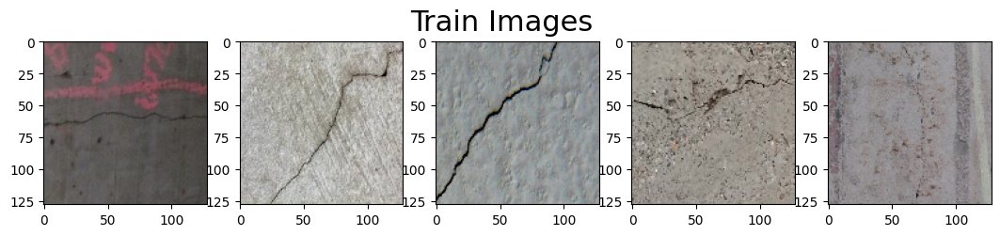

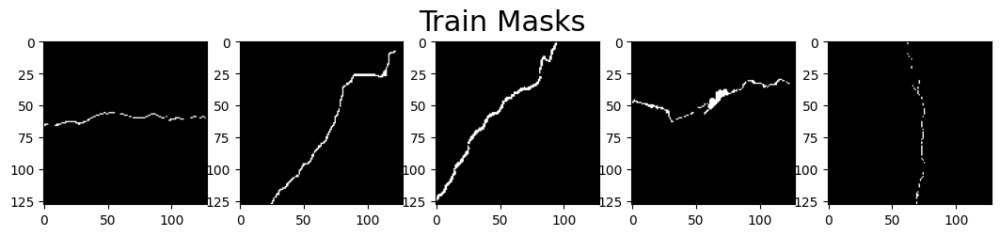

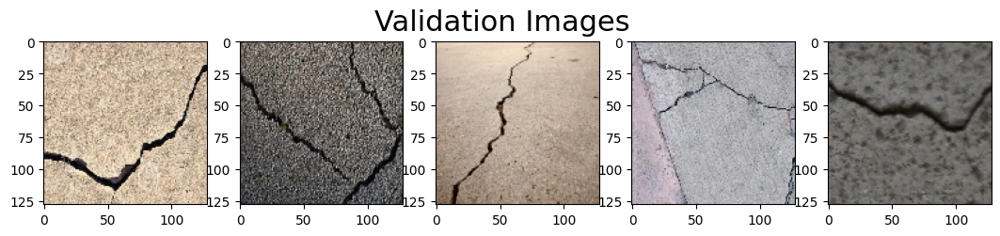

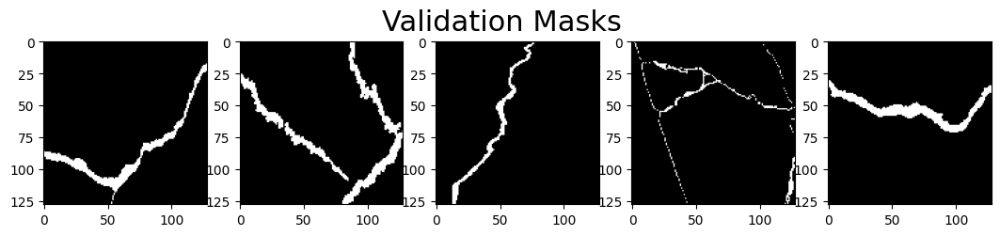

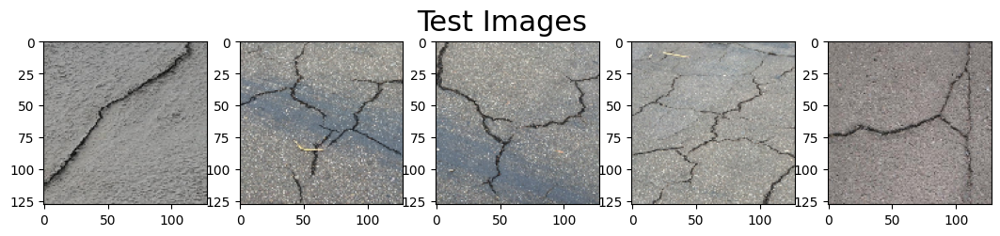

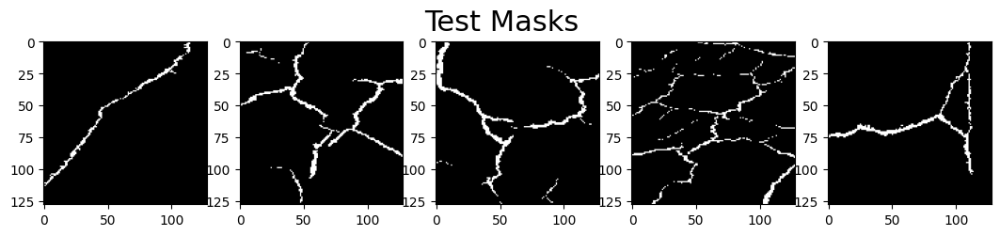

In [13]:
for image, mask in MakeTrain:
    break

fig, axes = plt.subplots(1, 5, figsize=(13,2.5))
fig.suptitle('Train Images', fontsize=22)
axes = axes.flatten()
for img, ax in zip(image[:5], axes[:5]):
    ax.imshow(img)
plt.show()

fig, axes = plt.subplots(1, 5, figsize=(13,2.5))
fig.suptitle('Train Masks', fontsize=22)
axes = axes.flatten()
for img, ax in zip(mask[:5], axes[:5]):
      ax.imshow(img, cmap='gray')
plt.show()



for image, mask in MakeValid:
    break

fig, axes = plt.subplots(1, 5, figsize=(13,2.5))
fig.suptitle('Validation Images', fontsize=22)
axes = axes.flatten()
for img, ax in zip(image[:5], axes[:5]):
    ax.imshow(img)
plt.show()

fig, axes = plt.subplots(1, 5, figsize=(13,2.5))
fig.suptitle('Validation Masks', fontsize=22)
axes = axes.flatten()
for img, ax in zip(mask[:5], axes[:5]):
      ax.imshow(img, cmap='gray')
plt.show()


for image, mask in MakeTest:
    break
fig, axes = plt.subplots(1, 5, figsize=(13,2.5))
fig.suptitle('Test Images', fontsize=22)
axes = axes.flatten()
for img, ax in zip(image[:5], axes[:5]):
    ax.imshow(img)
plt.show()

fig, axes = plt.subplots(1, 5, figsize=(13,2.5))
fig.suptitle('Test Masks', fontsize=22)
axes = axes.flatten()
for img, ax in zip(mask[:5], axes[:5]):
      ax.imshow(img, cmap='gray')
plt.show()

In [25]:
Batch = 10
Dimention=(256, 256)


## Creating Augmented Pictures For Training

In [26]:
TrainAugmented= MakeImage(trainImagePics, trainMaskPics, Batch, Dimention, augmentation = True)
# No Augmentation needed for Validation and Test
ValidNotAugmented= MakeImage(ValidImagePics, ValidMaskPics, Batch, Dimention, augmentation = False)
TestNotAugmented=MakeImage(PathTest,PathTestMask,Batch,Dimention,augmentation=False)


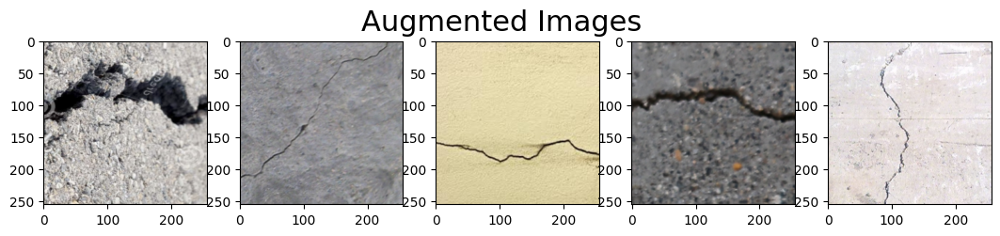

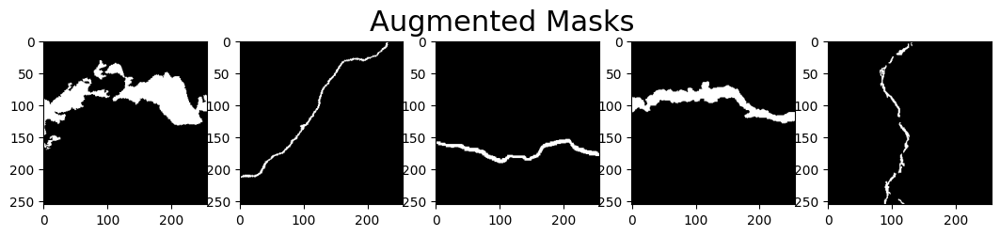

In [ ]:

for i, j in TrainAugmented:
    break

fig, axes = plt.subplots(1, 5, figsize=(13,2.5))
fig.suptitle('Augmented Images', fontsize=22)
axes = axes.flatten()
for img, ax in zip(i[:5], axes[:5]):
    ax.imshow(img)
plt.show()

fig, axes = plt.subplots(1, 5, figsize=(13,2.5))
fig.suptitle('Augmented Masks', fontsize=22)
axes = axes.flatten()
for img, ax in zip(j[:5], axes[:5]):
      ax.imshow(img, cmap='gray')
plt.show()


## Defining ResNet Components

In [ ]:
#Applying Batch Norm after each Batch Normalization
def BatchNormActivation(datax, active = True):
    datax = BatchNormalization()(datax)
    if (active):
        datax = Activation("relu")(datax)
    return datax

#2D Convolution Block
def Conv2DBlock(datax, filter, kernel_size = (3, 3), padding = "same", strides = 1):
    conv = BatchNormActivation(datax)
    conv = Conv2D(filter, kernel_size, padding = padding, strides = strides)(conv)
    return conv
     
     
# Residual Block
def res_block(datax, filter, kernel_size = (3, 3), padding = "same", strides = 1):
    residual = Conv2DBlock(datax, filter, kernel_size = kernel_size, padding = padding, strides = strides)
    residual = Conv2DBlock(residual, filter, kernel_size = kernel_size, padding = padding, strides = 1)
    
    bridge = Conv2D(filter, kernel_size = (1, 1), padding = padding, strides = strides)(datax)
    # No activation in bridge connection
    bridge = BatchNormActivation(bridge, active = False) 
    
    result = Add()([bridge, residual])
    return result
     

# Fixed Block
def fixed(datax, filter, kernel_size=(3, 3), padding="same", strides=1):
    conv = Conv2D(filter, kernel_size, padding = padding, strides = strides)(datax)
    conv = Conv2DBlock(conv, filter, kernel_size = kernel_size, padding = padding, strides = strides)
    
    #skip
    bridge = Conv2D(filter, kernel_size = (1, 1), padding = padding, strides = strides)(datax)
    bridge = BatchNormActivation(bridge, active = False) # No activation in skip connection
    
    result = Add()([conv, bridge])
    return result


# Upsampling Concatenation block
def upsamplingBlock(datax, dataxskip):
    up = UpSampling2D((2, 2))(datax)
    concat = Concatenate()([up, dataxskip])
    return concat
    


## RestNet Structure

In [ ]:

def ResUNet():
    files = [16, 32, 64, 128, 256]
    inputs = Input((Dimention[0], Dimention[1], 3))
    
    ## Encoder/downsampling/contracting path
    encoder0 = inputs
    encoder1 = fixed(encoder0, files[0])
    encoder2 = res_block(encoder1, files[1], strides = 2)
    encoder3 = res_block(encoder2, files[2], strides = 2)
    encoder4 = res_block(encoder3, files[3], strides = 2)
    encoder5 = res_block(encoder4, files[4], strides = 2)
    
    ## Bridge/Bottleneck
    bridge0 = Conv2DBlock(encoder5, files[4], strides = 1)
    bridge1 = Conv2DBlock(bridge0, files[4], strides = 1)
    
    ## Decoder/upsampling/expansive path
    up1 = upsamplingBlock(bridge1, encoder4)
    decoder1 = res_block(up1, files[4])
    
    up2 = upsamplingBlock(decoder1, encoder3)
    decoder2 = res_block(up2, files[3])
    
    up3 = upsamplingBlock(decoder2, encoder2)
    decoder3 = res_block(up3, files[2])
    
    up4 = upsamplingBlock(decoder3, encoder1)
    decoder4 = res_block(up4, files[1])
    
    outputs = Conv2D(1, (1, 1), padding = "same", activation = "sigmoid")(decoder4)
    model = Model(inputs, outputs)
    return model


In [ ]:
K.clear_session()
model = ResUNet()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

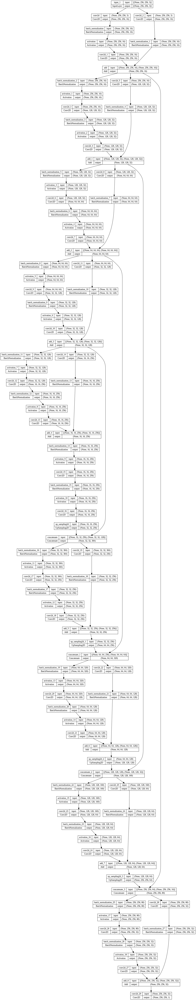

In [ ]:
plot_model(
    model,
    to_file="Resnetmodel.png",
    show_shapes=True,
    show_layer_names=True,
    expand_nested=True,
)

## Model Compile Params

In [46]:
smooth = 1.
thresh = 0.5
epochthresh = [150, 80, 50, 30]

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

def IOU(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    thresh = 0.5
    y_true = K.cast(K.greater_equal(y_true, thresh), 'float32')
    y_pred = K.cast(K.greater_equal(y_pred, thresh), 'float32')
    union = K.sum(K.maximum(y_true, y_pred)) + K.epsilon()
    intersection = K.sum(K.minimum(y_true, y_pred)) + K.epsilon()
    iou = intersection/union
    return iou

def learningScheduale(epoch):
    lr =0.0035
    if epoch >epochthresh[0]:
        lr *=2**-1
    elif epoch >epochthresh[1]:
        lr *=2**(-1)
    elif epoch >epochthresh[2]:
        lr *=2**(-1)
    elif epoch >epochthresh[3]:
        lr *=2**(-1)
    return lr
     


In [ ]:
# Prepare callbacks for model saving and for learning rate adjustment.
learning_rate_scheduler = LearningRateScheduler(learningScheduale)
learning_rate_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1), min_lr=0.5e-6, cooldown=0,patience=5)
callbacks = [learning_rate_reducer, learning_rate_scheduler]

optimiser=tf.keras.optimizers.Adam(learning_rate=learningScheduale(0),beta_1=0.9,beta_2=0.999,epsilon=1e-07,amsgrad=True,name="Adam")


In [ ]:
model.compile(optimizer =optimiser , loss = dice_coef_loss, metrics = ['accuracy', IOU, dice_coef])  

In [ ]:

model.save('/content/drive/My Drive/Colab Notebooks/ResUnet.h5')
     

In [ ]:
TrainingNumber = len(trainImagePics)//Batch
ValidationNumber = len(ValidImagePics)//Batch

history = model.fit(TrainAugmented,  steps_per_epoch=TrainingNumber,validation_data = ValidNotAugmented, validation_steps = ValidationNumber,initial_epoch = 0, epochs=100,callbacks=callbacks)

Epoch 1/100
28/28 [==============================] - 29s 272ms/step - loss: 0.4213 - accuracy: 0.9507 - IOU: 0.4356 - dice_coef: 0.5787 - val_loss: 0.9951 - val_accuracy: 0.9495 - val_IOU: 0.0023 - val_dice_coef: 0.0049 - lr: 0.0035
Epoch 2/100
28/28 [==============================] - 7s 262ms/step - loss: 0.2927 - accuracy: 0.9798 - IOU: 0.5537 - dice_coef: 0.7073 - val_loss: 0.9999 - val_accuracy: 0.9676 - val_IOU: 4.7069e-12 - val_dice_coef: 8.1302e-05 - lr: 0.0035
Epoch 3/100
28/28 [==============================] - 8s 263ms/step - loss: 0.2958 - accuracy: 0.9788 - IOU: 0.5492 - dice_coef: 0.7042 - val_loss: 1.0000 - val_accuracy: 0.9676 - val_IOU: 4.7069e-12 - val_dice_coef: 4.7101e-05 - lr: 0.0035
Epoch 4/100
28/28 [==============================] - 7s 248ms/step - loss: 0.2761 - accuracy: 0.9800 - IOU: 0.5762 - dice_coef: 0.7239 - val_loss: 1.0000 - val_accuracy: 0.9676 - val_IOU: 4.7069e-12 - val_dice_coef: 4.7067e-05 - lr: 0.0035
Epoch 5/100
28/28 [============================

## Observing Model Performance Metrics

In [ ]:
TrainingLoss = history.history['loss']
ValidationLoss = history.history['val_loss']
TrainingAccuracy = history.history['accuracy']
ValidationAccuracy = history.history['val_accuracy']

TrainDC = history.history['dice_coef']
valiDC = history.history['val_dice_coef']
TrainIOU = history.history['IOU']
ValidIOU = history.history['val_IOU']
     

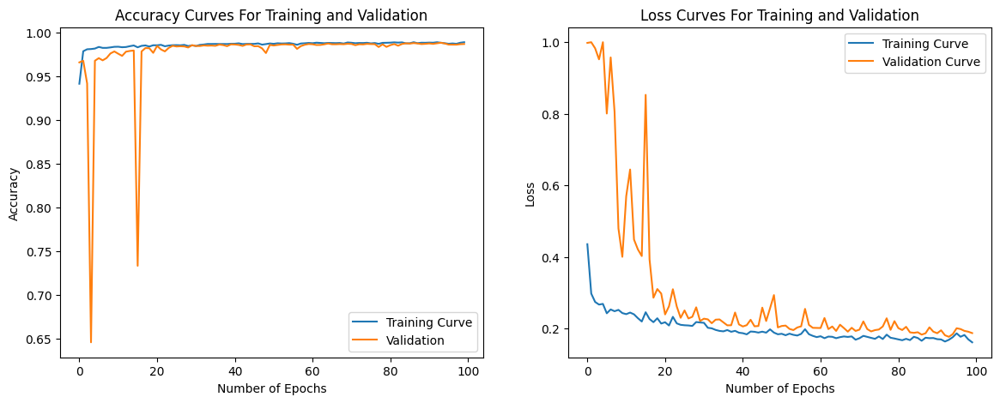

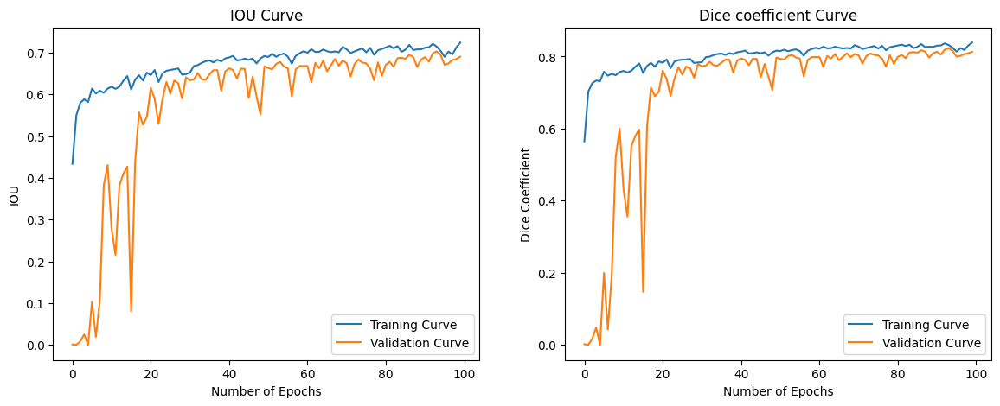

In [ ]:

fig, axes = plt.subplots(1, 2, figsize=(14,5))
axes = axes.flatten()
axes[1].plot(TrainingLoss, label='Training Curve')
axes[1].plot(ValidationLoss, label='Validation Curve')
axes[1].set_title('Loss Curves For Training and Validation')
axes[1].set_xlabel('Number of Epochs')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[0].plot(TrainingAccuracy, label='Training Curve')
axes[0].plot(ValidationAccuracy, label='Validation')
axes[0].set_title('Accuracy Curves For Training and Validation')
axes[0].set_xlabel('Number of Epochs')
axes[0].set_ylabel('Accuracy')
axes[0].legend()
plt.show()


fig, axes = plt.subplots(1, 2, figsize=(14,5))
axes = axes.flatten()
axes[0].plot(TrainIOU, label='Training Curve')
axes[0].plot(ValidIOU, label='Validation Curve')
axes[0].set_title('IOU Curve')
axes[0].set_xlabel('Number of Epochs')
axes[0].set_ylabel('IOU')
axes[0].legend()
axes[1].plot(TrainDC, label='Training Curve')
axes[1].plot(valiDC, label='Validation Curve')
axes[1].set_title('Dice coefficient Curve')
axes[1].set_xlabel('Number of Epochs')
axes[1].set_ylabel('Dice Coefficient')
axes[1].legend()

plt.show()     

In [ ]:
ValidTestPic = MakeImage(ValidImagePics, ValidMaskPics,30 , Dimention)

for i,j in ValidTestPic:
  break
yprime = model.predict(i)
yTrueF = (j>thresh).flatten()
yPrimeF = (yprime>thresh).flatten()


1/1 [==============================] - 6s 6s/step


## Performance Reports

## Validation Performance

In [ ]:
res = classification_report(yTrueF, yPrimeF, output_dict=True)
Accuracy = accuracy_score(yTrueF, yPrimeF)
Precision = res['True']['precision']
Recall = res['True']['recall']
F1_score = res['True']['f1-score']
AUC = roc_auc_score(j.flatten(), yprime.flatten())
IOU = (Precision*Recall)/(Precision+Recall-Precision*Recall)
print("Accuracy: {0:.2f}".format(Accuracy))
print("Precision: {0:.2f}".format(Precision))
print("Recall: {0:.2f}".format(Recall))
print("F1-Score: {0:.2f}\n".format(F1_score))
print('*'*70,'\n')
print(classification_report(yTrueF, yPrimeF))

Accuracy: 0.99
Precision: 0.75
Recall: 0.88
F1-Score: 0.81

********************************************************************** 

              precision    recall  f1-score   support

       False       1.00      0.99      0.99   1268220
        True       0.75      0.88      0.81     42500

    accuracy                           0.99   1310720
   macro avg       0.87      0.94      0.90   1310720
weighted avg       0.99      0.99      0.99   1310720



## Test Performance

In [ ]:

TestPic = MakeImage(PathTest,PathTestMask,237 , Dimention)

for i,j in TestPic:
  break
yprime = model.predict(i)
yTrueF = (j>thresh).flatten()
yPrimeF = (yprime>thresh).flatten()



8/8 [==============================] - 13s 723ms/step


In [ ]:
res = classification_report(yTrueF, yPrimeF, output_dict=True)
Accuracy = accuracy_score(yTrueF, yPrimeF)
Precision = res['True']['precision']
Recall = res['True']['recall']
F1_score = res['True']['f1-score']
AUC = roc_auc_score(j.flatten(), yprime.flatten())
IOU = (Precision*Recall)/(Precision+Recall-Precision*Recall)
print("Accuracy: {0:.2f}".format(Accuracy))
print("Precision: {0:.2f}".format(Precision))
print("Recall: {0:.2f}".format(Recall))
print("F1-Score: {0:.2f}\n".format(F1_score))
print('*'*70,'\n')
print(classification_report(yTrueF, yPrimeF))

Accuracy: 0.99
Precision: 0.91
Recall: 0.83
F1-Score: 0.87

********************************************************************** 

              precision    recall  f1-score   support

       False       0.99      1.00      0.99  14780073
        True       0.91      0.83      0.87    751959

    accuracy                           0.99  15532032
   macro avg       0.95      0.91      0.93  15532032
weighted avg       0.99      0.99      0.99  15532032



8/8 [==============================] - 2s 205ms/step


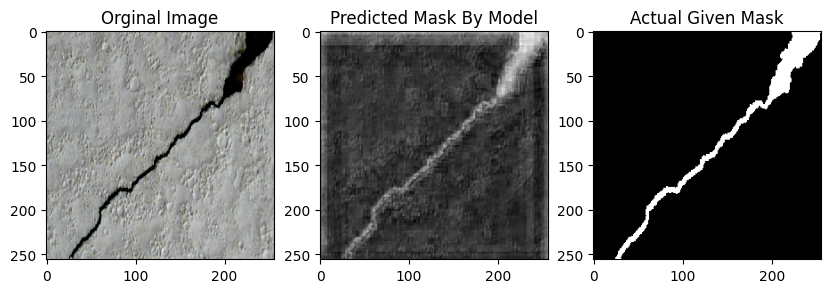

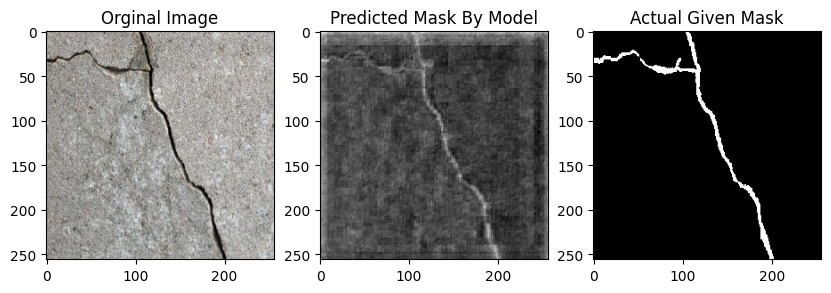

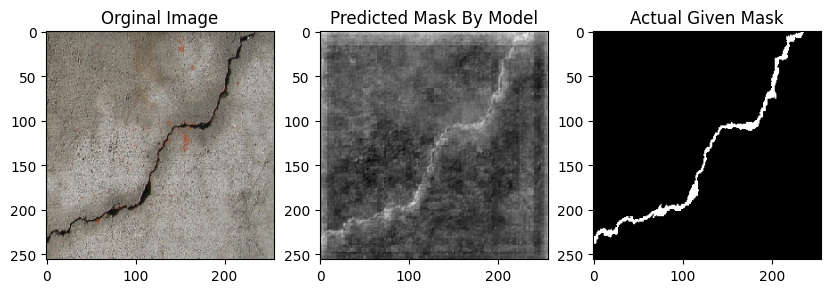

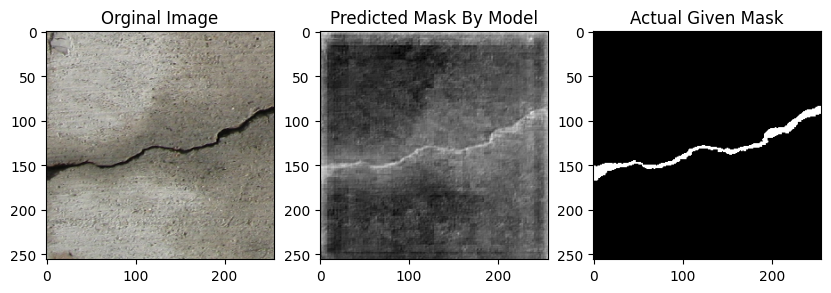

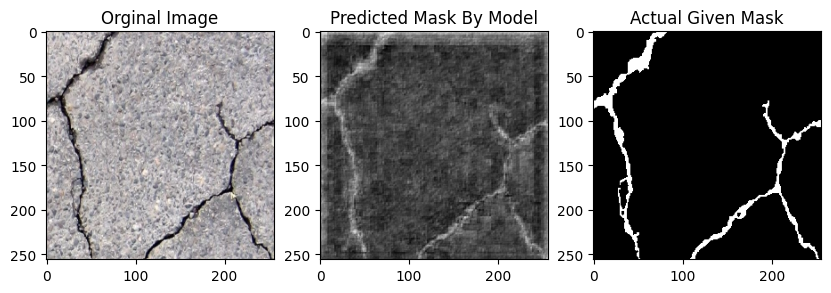

...

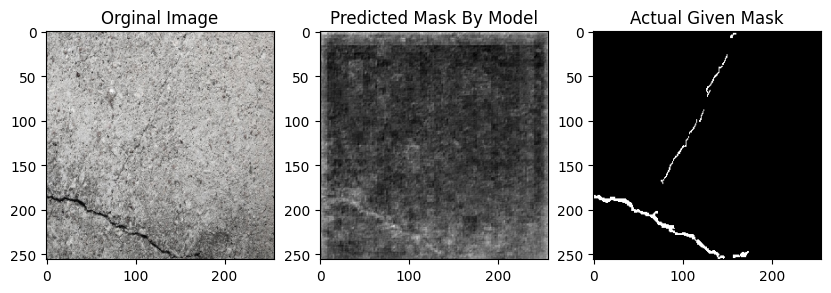

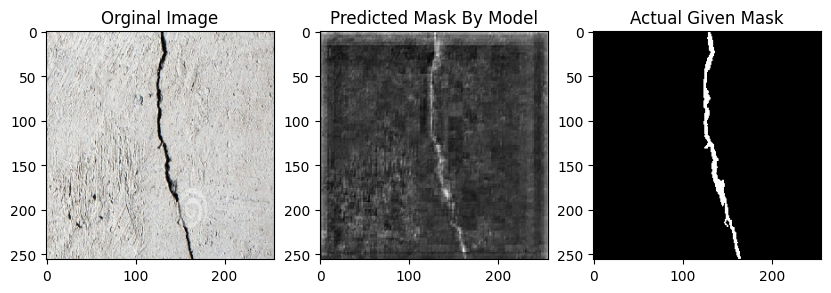

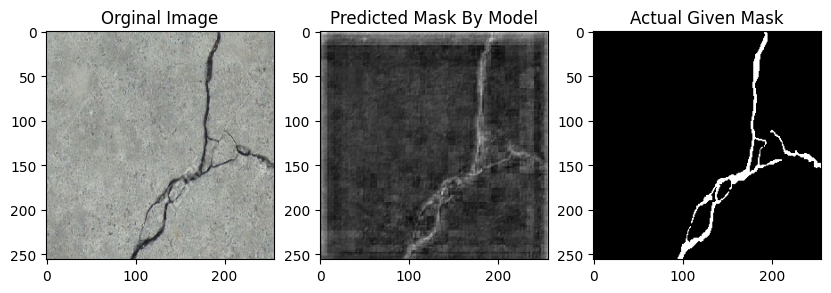

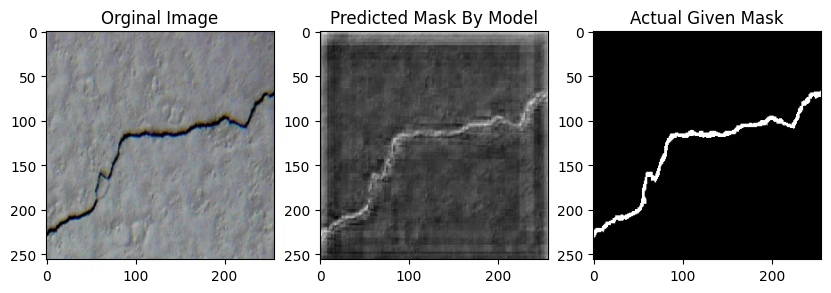

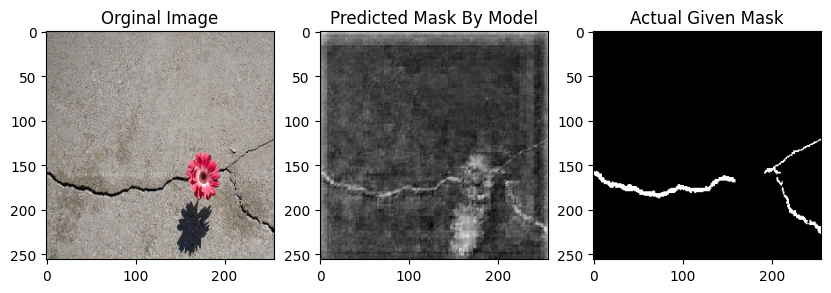

In [ ]:
TestPic = MakeImage(PathTest,PathTestMask,237 , Dimention)


def prediction(valMap, model, shape=256):
    for i, j in valMap:
      break
    img =i
    mask = j
    predictions = model.predict(img)
    # for i in range(len(predictions)):
    #     predictions[i] = cv2.cvtColor(predictions[i] , cv2.COLOR_BGR2RGB)
    return predictions, img, mask


def PlotMaker(img, predMask, groundTruth):
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Orginal Image')
    plt.subplot(1, 3, 2)
    plt.imshow(predMask, cmap='gray')
    plt.title('Predicted Mask By Model')
    plt.subplot(1, 3, 3)
    plt.imshow(groundTruth, cmap='gray')
    plt.title('Actual Given Mask')
    plt.show()

pred, actuals, masks = prediction(TestPic, ResUNet())

for i in range(20):
  j = random.randint(0, (len(pred)-1))
  PlotMaker(actuals[j], pred[j], masks[j])


# 2.B. Crack Segmentation Using UNet

## Defining UNet Components

In [34]:
def Unet(img_rows, img_cols, img_channels):  
    x = Input(shape=(img_rows, img_cols, img_channels))
    
    # Encoder 
    conv1 = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    conv2 = Conv2D(64, (3, 3), padding='same', activation='relu')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv2)

    
    conv3 = Conv2D(128, (3, 3), padding='same', activation='relu')(pool1)
    conv4 = Conv2D(128, (3, 3), padding='same', activation='relu')(conv3)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv4)

    
    conv5 = Conv2D(256, (3, 3), padding='same', activation='relu')(pool2)
    conv6 = Conv2D(256, (3, 3), padding='same', activation='relu')(conv5)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv6)

    
    conv7 = Conv2D(512, (3, 3), padding='same', activation='relu')(pool3)
    conv8 = Conv2D(512, (3, 3), padding='same', activation='relu')(conv7)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv8)

    
    conv9 = Conv2D(1024, (3, 3), padding='same', activation='relu')(pool4)
    conv10 = Conv2D(1024, (3, 3), padding='same', activation='relu')(conv9)
    
    # Decoder
    convT1 = Conv2D(512, (2, 2), padding='same', activation='relu')(UpSampling2D(size=(2, 2))(conv10))
    merge1 = concatenate([convT1, conv8], axis=3)
    conv11 = Conv2D(512, (3, 3), padding='same', activation='relu')(merge1)
    conv12 = Conv2D(512, (3, 3), padding='same', activation='relu')(conv11)
    
    convT2 = Conv2D(256, (2, 2), padding='same', activation='relu')(UpSampling2D(size=(2, 2))(conv12))
    merge2 = concatenate([convT2, conv6], axis=3)
    conv13 = Conv2D(256, (3, 3), padding='same', activation='relu')(merge2)
    conv14 = Conv2D(256, (3, 3), padding='same', activation='relu')(conv13)
    
    convT3 = Conv2D(128, (2, 2), padding='same', activation='relu')(UpSampling2D(size=(2, 2))(conv14))
    merge3 = concatenate([convT3, conv4], axis=3)
    conv15 = Conv2D(128, (3, 3), padding='same', activation='relu')(merge3)
    conv16 = Conv2D(128, (3, 3), padding='same', activation='relu')(conv15)
    
    convT4 = Conv2D(64, (2, 2), padding='same', activation='relu')(UpSampling2D(size=(2, 2))(conv16))
    merge4 = concatenate([convT4, conv2], axis=3)
    conv17 = Conv2D(64, (3, 3), padding='same', activation='relu')(merge4)
    conv18 = Conv2D(64, (3, 3), padding='same', activation='relu')(conv17)

    y = Conv2D(1, (1, 1), activation='softmax')(conv18)  

    return Model(inputs=x, outputs=y)

In [35]:
# inputs = tf.keras.layers.Input((128, 128, 3))
Unetmodel = Unet( 256, 256, 3)
Unetmodel.summary()




Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_69 (Conv2D)             (None, 256, 256, 64  1792        ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_70 (Conv2D)             (None, 256, 256, 64  36928       ['conv2d_69[0][0]']              
                                )                                                           

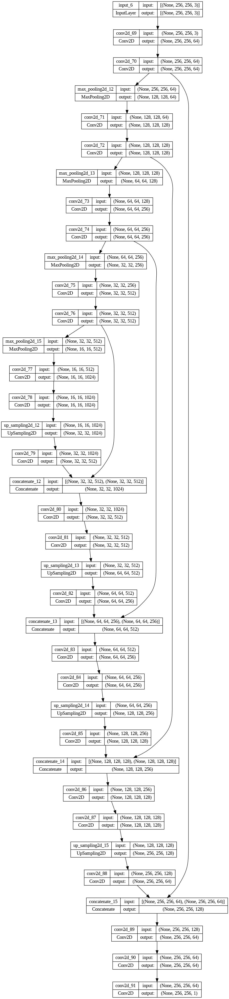

In [49]:

adam = Adam(lr=0.00001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0) # lr = 0.0009
Unetmodel.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy', IOU])

plot_model(Unetmodel, to_file='UNet.pdf', show_shapes=True)
plot_model(
    Unetmodel,
    to_file="modelUnet.png",
    show_shapes=True,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,

)




In [50]:

checkpointer = ModelCheckpoint(filepath='bestmodel_' + 'MuUnet' + '.h5', monitor='val_loss', verbose=0, save_best_only=True,mode='min')

TrainingNumber = len(trainImagePics)//Batch
ValidationNumber = len(ValidImagePics)//Batch

history = Unetmodel.fit(TrainAugmented,  steps_per_epoch=TrainingNumber,validation_data = ValidNotAugmented, validation_steps = ValidationNumber,initial_epoch = 0, epochs=20)

Epoch 1/20


/usr/local/lib/python3.9/dist-packages/tensorflow/python/util/dispatch.py:1176: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, None, None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return dispatch_target(*args, **kwargs)


28/28 [==============================] - 20s 665ms/step - loss: nan - accuracy: 0.9651 - IOU: 4.5707e-12 - val_loss: nan - val_accuracy: 0.9656 - val_IOU: 4.6583e-12
Epoch 2/20
28/28 [==============================] - 16s 581ms/step - loss: nan - accuracy: 0.9647 - IOU: 4.4904e-12 - val_loss: nan - val_accuracy: 0.9656 - val_IOU: 4.6583e-12
Epoch 3/20
28/28 [==============================] - 16s 586ms/step - loss: nan - accuracy: 0.9644 - IOU: 4.4993e-12 - val_loss: nan - val_accuracy: 0.9656 - val_IOU: 4.6583e-12
Epoch 4/20
28/28 [==============================] - 17s 588ms/step - loss: nan - accuracy: 0.9646 - IOU: 4.4758e-12 - val_loss: nan - val_accuracy: 0.9656 - val_IOU: 4.6583e-12
Epoch 5/20
28/28 [==============================] - 17s 598ms/step - loss: nan - accuracy: 0.9643 - IOU: 4.4358e-12 - val_loss: nan - val_accuracy: 0.9656 - val_IOU: 4.6583e-12
Epoch 6/20
28/28 [==============================] - 17s 593ms/step - loss: nan - accuracy: 0.9647 - IOU: 4.5302e-12 - val_loss

In [51]:

Unetmodel.save_weights('UNets_weights.h5')
Unetmodel.save('UNet.h5')


In [82]:
x, TrainingAccuracy, TrainingIOU = Unetmodel.evaluate(TrainAugmented)
x, ValidationAccuracy, ValidationIOU = Unetmodel.evaluate(ValidNotAugmented)
x, TestAccuracy, TestIOU = Unetmodel.evaluate(TestNotAugmented)
print("Training Accuracy= {}\nValidation Accuracy = {}\nTest Accuracy = {}\n".format(TrainingAccuracy, ValidationAccuracy, TestAccuracy))
print('*' * 60)
print("Training IOU = {}\nValidation IOU = {}\nTest IOU ={}\n".format(TrainingIOU, ValidationIOU, TestIOU))


24/24 [==============================] - 4s 183ms/step - loss: nan - accuracy: 0.9516 - IOU: 3.8260e-12
Training Accuracy= 0.9647977352142334
Validation Accuracy = 0.9656326174736023
Test Accuracy = 0.9515865445137024

************************************************************
Training IOU = 4.4884343637641155e-12
Validation IOU = 4.658321037936952e-12
Test IOU =3.825993341588507e-12



In [77]:

TestPic = MakeImage(PathTest,PathTestMask,237 , Dimention)

for i,j in TestPic:
  break
yprime = Unetmodel.predict(i)
yTrueF = (j>thresh).flatten()
yPrimeF = (yprime>thresh).flatten()


8/8 [==============================] - 4s 505ms/step


1/1 [==============================] - 1s 1s/step


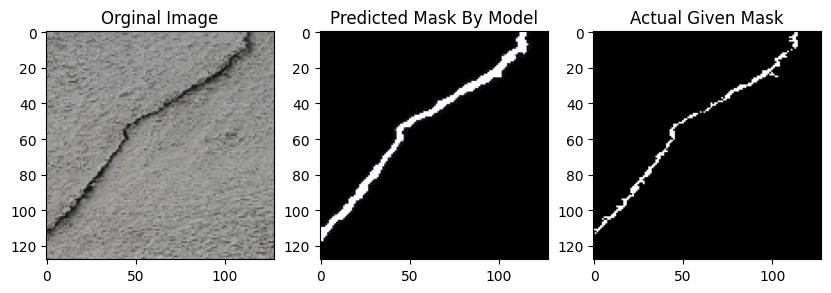

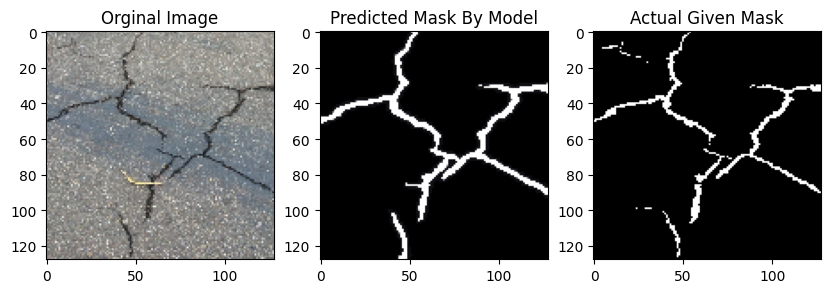

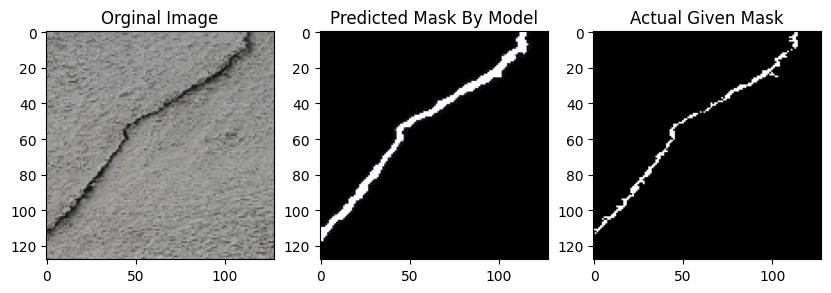

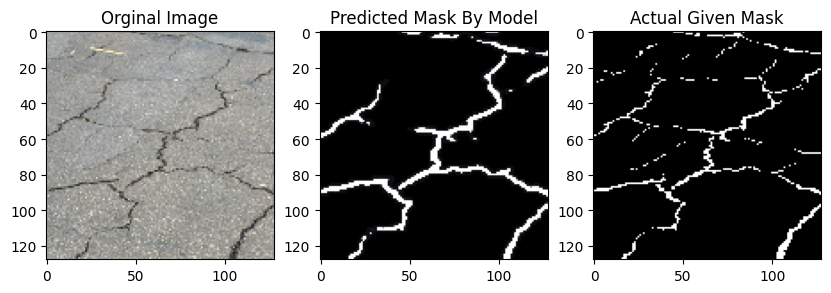

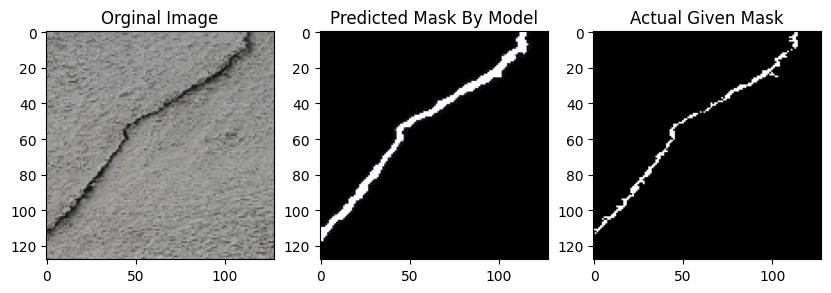

...

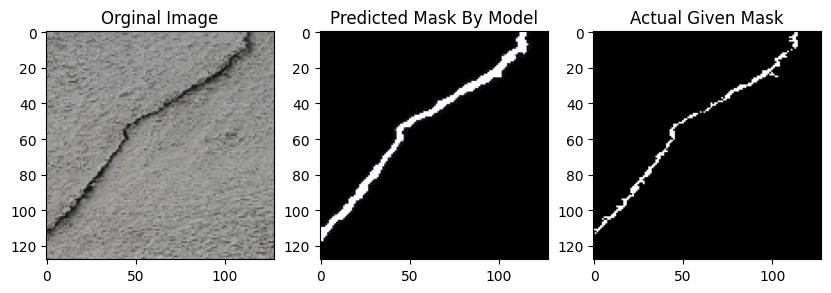

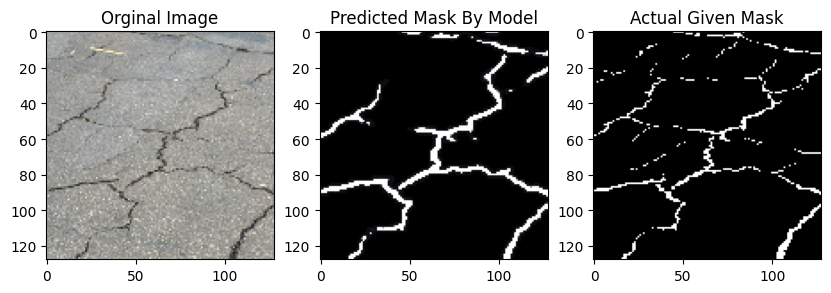

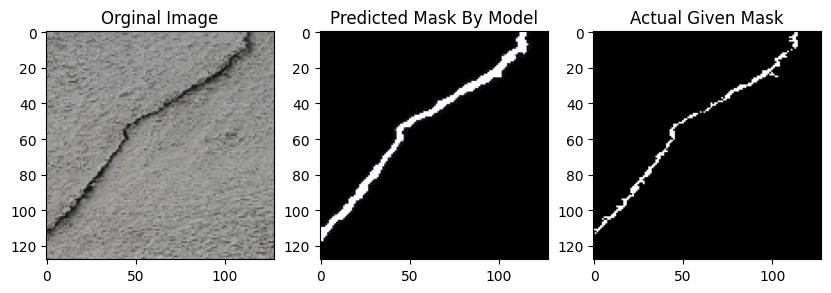

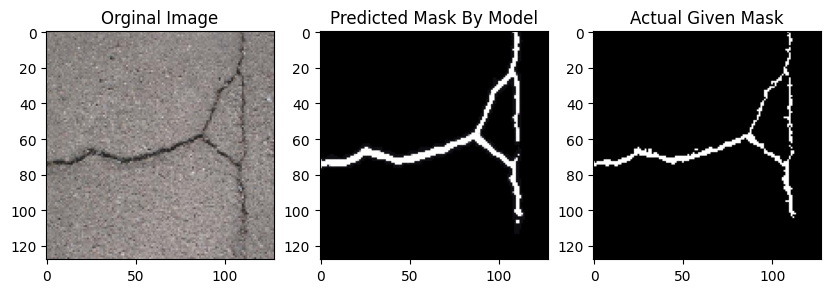

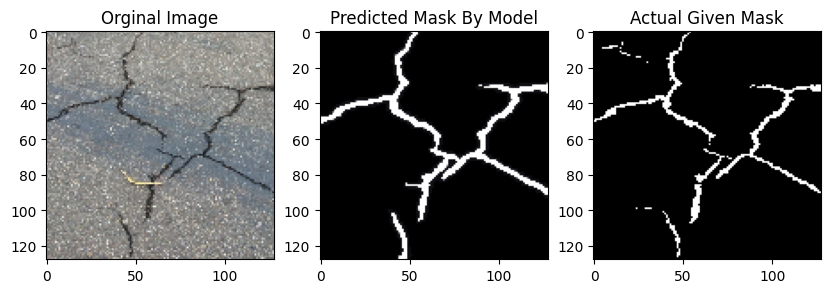

In [ ]:
TestPic = MakeImage(PathTest,PathTestMask,237 , Dimention)

def prediction(valMap, model, shape=256):
    for i, j in valMap:
      break
    img =i
    mask = j
    predictions = model.predict(img)
    for i in range(len(predictions)):
        predictions[i] = cv2.merge((predictions[i, :, :, 0], predictions[i, :, :, 1], predictions[i, :, :, 2]))
    return predictions, img, mask


def PlotMaker(img, predMask, groundTruth):
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title('Orginal Image')
    plt.subplot(1, 3, 2)
    plt.imshow(predMask)
    plt.title('Predicted Mask By Model')
    plt.subplot(1, 3, 3)
    plt.imshow(groundTruth, cmap='gray')
    plt.title('Actual Given Mask')
    plt.show()

pred, actuals, masks = prediction(TestPic, Unetmodel)

for i in range(20):
  j = random.randint(0, (len(pred)-1))
  PlotMaker(actuals[j], pred[j], masks[j])

